# Mismatch

In [2]:
%load_ext autoreload
%autoreload 2
import cascade as cas
import flow
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import pandas as pd
import warnings
from cascade import utils
from scipy.stats import pearsonr
from copy import deepcopy

In [321]:
# set parameters
mice = cas.lookups.mice['all12']
# words = ['facilitate'] * len(mice)
words = ['bookmarks' if s in 'OA27' else 'horrible' for s in mice]
group_by = 'all3'

rank_level_sort = 15

# mice = ['OA27']
# words = ['bookmarks']

# load in a full size tensor
model_list = []
tensor_list = []
id_list = []
bhv_list = []
meta_list = []
for mouse, word in zip(mice, words):
    
    # return   model, ids, tensor, meta, bhv
    out = cas.load.load_all_groupday(mouse, word=word, with_model=True, group_by=group_by, nan_thresh=0.95)
    sorted_model, sort_order = utils.sortfactors(out[0])
    model_list.append(sorted_model)
    tensor_list.append(out[2][sort_order[rank_level_sort - 1], :, :])
    id_list.append(out[1][sort_order[rank_level_sort - 1]])
    bhv_list.append(out[4])
    meta_list.append(utils.add_stages_to_meta(out[3], 'parsed_11stage'))

Updated naive cs-ori pairings to match learning.
     135 plus
     270 minus
     0 neutral
Updated naive trialerror to match learning.
Updated naive cs-ori pairings to match learning.
     0 plus
     270 minus
     135 neutral
Updated naive trialerror to match learning.
Updated naive cs-ori pairings to match learning.
     270 plus
     0 minus
     135 neutral
Updated naive trialerror to match learning.
Updated naive cs-ori pairings to match learning.
     135 plus
     0 minus
     270 neutral
Updated naive trialerror to match learning.
Updated naive cs-ori pairings to match learning.
     270 plus
     135 minus
     0 neutral
Updated naive trialerror to match learning.
Updated naive cs-ori pairings to match learning.
     270 plus
     135 minus
     0 neutral
Updated naive trialerror to match learning.
Updated naive cs-ori pairings to match learning.
     135 plus
     0 minus
     270 neutral
Updated naive trialerror to match learning.
Updated naive cs-ori pairings to match le

## build tuning Dataframes (optional)

In [334]:
# tuning_list_LR = []
# for meta, tensor, model in zip(meta_list, tensor_list, model_list):
#     df = cas.tuning.cell_tuning(meta, tensor, model, 15, by_stage=False, by_reversal=True, staging='parsed_11stage', tuning_type='cond')
#     tuning_list_LR.append(df)
    
tuning_list_LR_init = []
for meta, tensor, model in zip(meta_list, tensor_list, model_list):
    df = cas.tuning.cell_tuning(meta, tensor, model, 15, by_stage=False, by_reversal=True, staging='parsed_11stage', tuning_type='initial')
    tuning_list_LR_init.append(df)

s:\twophoton_analysis\code\cascade\cascade\utils.py:1570: RuntimeWarning: All-NaN slice encountered
  above_thresh = ~np.isnan(np.nanmax(weights, axis=1))
s:\twophoton_analysis\code\cascade\cascade\tuning.py:80: RuntimeWarning: Mean of empty slice
  trial_avg_vec = np.nanmean(cell_mat, axis=0)
s:\twophoton_analysis\code\cascade\cascade\tuning.py:358: RuntimeWarning: Mean of empty slice
  mean_cue.append(np.nanmean(rect_trial_avg_vec[cue_boo]))
s:\twophoton_analysis\code\cascade\cascade\tuning.py:410: RuntimeWarning: Mean of empty slice
  mean_cue.append(np.nanmean(rect_trial_avg_vec[cue_boo]))


## load pre-existing preferred tensors
- These are best tuning, so minus-plus use minus trials for example

In [332]:
loaded_pref_tensor_list = []
for meta in meta_list:
    
    mouse = meta.reset_index()['mouse'].unique()[0]
    pt = np.load(f'/twophoton_analysis/Data/analysis/Group-attractive/all12_pref_tensor_list_{mouse}.npy')
    loaded_pref_tensor_list.append(pt)

In [43]:
# # to test on OA27
# loaded_pref_tensor_list = []
# pt = np.load(f'/twophoton_analysis/Data/analysis/Group-attractive/all12_pref_tensor_list_OA27.npy')
# loaded_pref_tensor_list.append(pt)

## calculate mismatch at time of reversal

In [356]:
rc_reversal_mismatch_list = []
pval_rc_boot_list = []
df_list = []
for meta, pref_tensor, tensor in zip(meta_list, loaded_pref_tensor_list, tensor_list):
    
#     if meta.reset_index().mouse.unique()[0] not in ['OA27']:
#         continue
    
#     rev_rc, pv = cas.mismatch.run_controlled_reversal_mismatch(meta, pref_tensor, filter_running=None, filter_hmm_engaged=True, boot=True)
#     rev_rc, pv = cas.mismatch.run_controlled_reversal_mismatch(meta, pref_tensor, filter_running='high_speed_only',
#                                                                filter_hmm_engaged=True, boot=True) 
# TODO calcing on high speed breaks due to low trials 
    
    df = cas.mismatch.run_controlled_naive_mismatch(meta, pref_tensor, filter_licking=None, filter_running=None,
                                                    filter_hmm_engaged=False, boot=True)
    df_list.append(df)
#     pval_rc_boot_list.append(pv)
#     rc_reversal_mismatch_list.append(rev_rc)
#     break
naive_rev_df = pd.concat(df_list, axis=0)

  -->  AS20: pre-rev: 1000, post-rev: 100


s:\twophoton_analysis\code\cascade\cascade\mismatch.py:315: RuntimeWarning: Mean of empty slice
  reversal_mismatch = np.nanmean(post_bins - pre_bins, axis=1)
s:\twophoton_analysis\code\cascade\cascade\mismatch.py:331: RuntimeWarning: Mean of empty slice
  boot_mat[:, booti] = np.nanmean(post_bins - pre_bins, axis=1)


  -->  AS20: significant mismatch: n = 19
Mouse AS20 did not have L0 naive.
  -->  AS23: pre-rev: 1000, post-rev: 100
  -->  AS23: significant mismatch: n = 18
Mouse AS23 did not have L0 naive.
Mouse AS41 did not have any reversal.
Mouse AS41 did not have L0 naive.
Mouse AS47 did not have any reversal.
  -->  AS47: naive: 1000, learning-start: 100


s:\twophoton_analysis\code\cascade\cascade\mismatch.py:376: RuntimeWarning: Mean of empty slice
  learn_mismatch = np.nanmean(post_learn_bins - pre_learn_bins, axis=1)
s:\twophoton_analysis\code\cascade\cascade\mismatch.py:392: RuntimeWarning: Mean of empty slice
  boot_mat[:, booti] = np.nanmean(post_bins - pre_bins, axis=1)


  -->  AS47: significant mismatch: n = 0
  -->  OA26: pre-rev: 1000, post-rev: 100
  -->  OA26: significant mismatch: n = 14
  -->  OA26: naive: 655, learning-start: 100
  -->  OA26: significant mismatch: n = 2
  -->  OA27: pre-rev: 725, post-rev: 100
  -->  OA27: significant mismatch: n = 54
  -->  OA27: naive: 414, learning-start: 100
  -->  OA27: significant mismatch: n = 11
  -->  OA32: pre-rev: 1000, post-rev: 100
  -->  OA32: significant mismatch: n = 32
Mouse OA32 did not have L0 naive.
  -->  OA34: pre-rev: 833, post-rev: 100
  -->  OA34: significant mismatch: n = 23
Mouse OA34 did not have L0 naive.
  -->  OA36: pre-rev: 1000, post-rev: 100
  -->  OA36: significant mismatch: n = 9
Mouse OA36 did not have L0 naive.
Mouse OA38 did not have any reversal.
Mouse OA38 did not have L0 naive.
  -->  OA67: pre-rev: 1000, post-rev: 100
  -->  OA67: significant mismatch: n = 22
  -->  OA67: naive: 487, learning-start: 52
  -->  OA67: significant mismatch: n = 16
  -->  VF226: pre-rev: 10

Text(0, 0.5, 'reversal start "mismatch"')

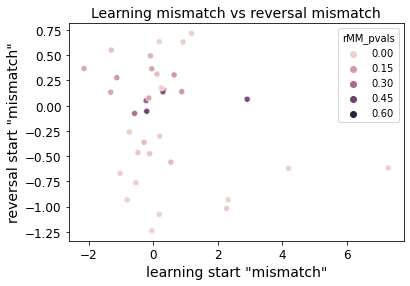

In [386]:
sns.scatterplot(data=naive_rev_df, x='lMM_response', y='rMM_response', hue=naive_rev_df.rMM_pvals)
plt.title('Learning mismatch vs reversal mismatch', size=14)
plt.xticks(size=12)
plt.yticks(size=12)
plt.xlabel('learning start "mismatch"', size=14)
plt.ylabel('reversal start "mismatch"', size=14)


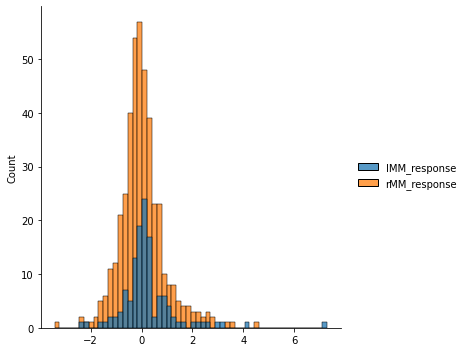

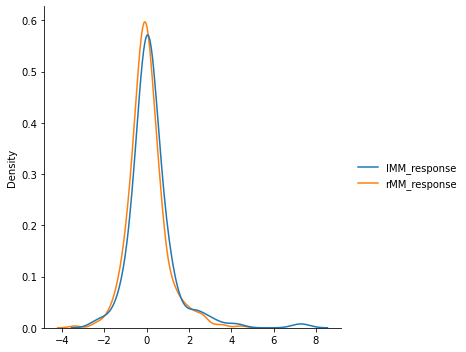

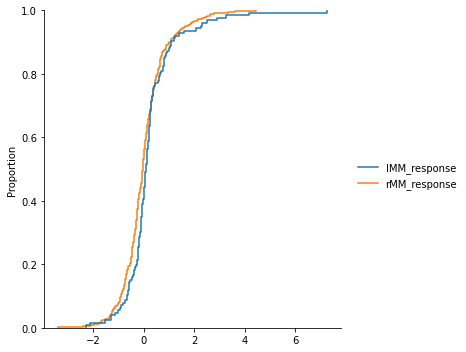

In [369]:
sns.displot(data=naive_rev_df.set_index(['mouse', 'cell_n']).drop(columns=['rMM_pvals', 'lMM_pvals']), kind='hist', )
sns.displot(data=naive_rev_df.set_index(['mouse', 'cell_n']).drop(columns=['rMM_pvals', 'lMM_pvals']), kind='kde', common_norm=False)
sns.displot(data=naive_rev_df.set_index(['mouse', 'cell_n']).drop(columns=['rMM_pvals', 'lMM_pvals']), kind='ecdf', )

In [329]:
# turn list outputs into a dataframe with index of mouse and cells
pref_rmm_list = []
for meta, rmm, pv in zip(meta_list, rc_reversal_mismatch_list, pval_rc_boot_list):
    mouse = meta.reset_index().mouse.unique()[0]
    df = pd.DataFrame(data={'mouse': [mouse] * len(pv),
                            'cell_n': [int(s + 1) for s in np.arange(len(pv))],
                            f'pv_pref': pv,
                            f'rmm_pref': rmm
                                })
    pref_rmm_list.append(df)
pref_rmm_df = pd.concat(pref_rmm_list, axis=0).set_index(['mouse', 'cell_n'])
pref_rmm_df.head()

pv_pref  rmm_pref
mouse cell_n                   
AS20  1         0.365 -0.160683
      2         0.100  0.489648
      3           NaN       NaN
      4           NaN       NaN
      5           NaN       NaN

## fraction of cells with a mismatch response 

In [326]:
for pv, rmm in zip(pval_rc_boot_list, rc_reversal_mismatch_list):
    print(f'Fraction of cells significant mismatch: {np.sum(pv < 0.05) / np.sum(~np.isnan(pv))}: {np.sum(pv < 0.05)} / {np.sum(~np.isnan(pv))}')
print('\n')
for pv, rmm in zip(pval_rc_boot_list, rc_reversal_mismatch_list):
    print(f'  -->  positive mismatch: {np.sum((pv < 0.05) & (rmm > 0)) / np.sum(~np.isnan(pv))}: {np.sum((pv < 0.05) & (rmm > 0))} / {np.sum(~np.isnan(pv))}')
print('\n')   
for pv, rmm in zip(pval_rc_boot_list, rc_reversal_mismatch_list):
    print(f'  -->  negative mismatch: {np.sum((pv < 0.05) & (rmm < 0)) / np.sum(~np.isnan(pv))}: {np.sum((pv < 0.05) & (rmm < 0))} / {np.sum(~np.isnan(pv))}')

Fraction of cells significant mismatch: 0.38636363636363635: 17 / 44
Fraction of cells significant mismatch: 0.3333333333333333: 12 / 36
Fraction of cells significant mismatch: nan: 0 / 0
Fraction of cells significant mismatch: nan: 0 / 0
Fraction of cells significant mismatch: 0.43243243243243246: 16 / 37
Fraction of cells significant mismatch: 0.39325842696629215: 35 / 89
Fraction of cells significant mismatch: 0.5: 36 / 72
Fraction of cells significant mismatch: 0.48214285714285715: 27 / 56
Fraction of cells significant mismatch: 0.47368421052631576: 18 / 38
Fraction of cells significant mismatch: nan: 0 / 0
Fraction of cells significant mismatch: 0.34146341463414637: 14 / 41
Fraction of cells significant mismatch: 0.6: 9 / 15


  -->  positive mismatch: 0.25: 11 / 44
  -->  positive mismatch: 0.1388888888888889: 5 / 36
  -->  positive mismatch: nan: 0 / 0
  -->  positive mismatch: nan: 0 / 0
  -->  positive mismatch: 0.13513513513513514: 5 / 37
  -->  positive mismatch: 0.078651685

Text(0.5, 1.0, 'Mismatch summary across mice')

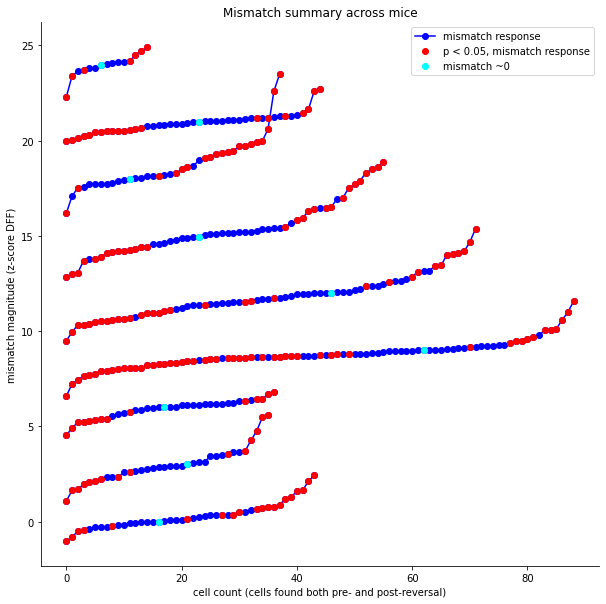

In [82]:
plt.figure(figsize=(10, 10))
counter = 0
for pv, rmm in zip(pval_rc_boot_list, rc_reversal_mismatch_list):
    
    if all(np.isnan(pv)):
        continue
    sorter = np.argsort(rmm)
    sort_rmm = rmm[sorter]
    sort_pv = pv[sorter] < 0.05
#     plt.scatter(np.arange(len(rmm))[sorter], rmm[sorter], color='blue')
    if counter == 0:
        plt.plot(sort_rmm + counter, '-o', color='blue', label='mismatch response')
        plt.plot(np.arange(len(sort_rmm))[sort_pv], sort_rmm[sort_pv] + counter, 'o', color='red', label='p < 0.05, mismatch response')
        plt.plot(np.arange(len(sort_rmm))[sort_rmm <= 0][-1], sort_rmm[sort_rmm <= 0][-1] + counter, 'o', color='cyan', label='mismatch ~0')
    else:
        plt.plot(sort_rmm + counter, '-o', color='blue')
        plt.plot(np.arange(len(sort_rmm))[sort_pv], sort_rmm[sort_pv] + counter, 'o', color='red')
        plt.plot(np.arange(len(sort_rmm))[sort_rmm <= 0][-1], sort_rmm[sort_rmm <= 0][-1] + counter, 'o', color='cyan')
        
    counter += 3
#     plt.scatter(np.arange(len(rmm))[pv < 0.05], rmm[pv < 0.05], color='red')
#     print(f'Fraction of cells significant mismatch: {np.sum(pv < 0.05) / np.sum(~np.isnan(pv))}')
plt.legend()
sns.despine()
plt.xlabel('cell count (cells found both pre- and post-reversal)')
plt.ylabel('mismatch magnitude (z-score DFF)')
plt.title('Mismatch summary across mice')

## Mismatch for all three stimuli for mice

In [83]:
rc_reversal_mismatch_list = []
pval_rc_boot_list = []
df_list = []
for meta, pref_tensor, tensor, tune in zip(meta_list, loaded_pref_tensor_list, tensor_list, tuning_list_LR_init):
    
    meta = utils.add_reversal_mismatch_condition_to_meta(meta)
    mouse = meta.reset_index().mouse.unique()[0]
    
    for rev_type in ['becomes_rewarded', 'becomes_unrewarded', 'remains_unrewarded']:
        
        boo_vec = ~meta.mismatch_condition.isin([rev_type]).values
        
        blanked_tensor = deepcopy(tensor)
        blanked_tensor[:,:,boo_vec] = np.nan
    
        rev_rc, pv = cas.mismatch.run_controlled_reversal_mismatch(meta, blanked_tensor, filter_hmm_engaged=True, boot=True)
    
        df = pd.DataFrame(data={'mouse': [mouse] * len(pv),
                                'cell_n': [int(s + 1) for s in np.arange(len(pv))],
                                f'pv_{rev_type}': pv,
                                f'rmm_{rev_type}': rev_rc
                                }
                         )
        df_list.append(df)
rmm_df_all_mice = pd.concat(df_list, axis=0)

s:\twophoton_analysis\code\cascade\cascade\utils.py:324: RuntimeWarning: Mean of empty slice
  trace_mean = np.nanmean(tensor, axis=2)
s:\twophoton_analysis\code\cascade\cascade\utils.py:156: RuntimeWarning: Mean of empty slice
  new_mat[offset_bool, :] = np.nanmean(ablated_tensor[offset_bool, :, :][:, response_bool, :], axis=1)
s:\twophoton_analysis\code\cascade\cascade\utils.py:158: RuntimeWarning: Mean of empty slice
  new_mat[~offset_bool, :] = np.nanmean(ablated_tensor[~offset_bool, :, :][:, stim_bool, :], axis=1)
s:\twophoton_analysis\code\cascade\cascade\utils.py:1774: RuntimeWarning: Mean of empty slice
  binned_set1[:, bc] = np.nanmean(set1_tensor[:, bin_trials1], axis=1)
s:\twophoton_analysis\code\cascade\cascade\mismatch.py:114: RuntimeWarning: Mean of empty slice
  reversal_mismatch = np.nanmean(post_bins - pre_bins, axis=1)
s:\twophoton_analysis\code\cascade\cascade\mismatch.py:130: RuntimeWarning: Mean of empty slice
  boot_mat[:, booti] = np.nanmean(post_bins - pre_bins,

AS20: pre-rev: 1810, post-rev: 100
  -->  AS20: pre-rev: 1792, post-rev: 100
  -->  AS20: significant mismatch: n = 0
AS20: pre-rev: 1810, post-rev: 100
  -->  AS20: pre-rev: 1792, post-rev: 100
  -->  AS20: significant mismatch: n = 50
AS20: pre-rev: 1810, post-rev: 100
  -->  AS20: pre-rev: 1792, post-rev: 100
  -->  AS20: significant mismatch: n = 26
AS23: pre-rev: 2125, post-rev: 100
  -->  AS23: pre-rev: 2125, post-rev: 100
  -->  AS23: significant mismatch: n = 0
AS23: pre-rev: 2125, post-rev: 100
  -->  AS23: pre-rev: 2125, post-rev: 100
  -->  AS23: significant mismatch: n = 43
AS23: pre-rev: 2125, post-rev: 100
  -->  AS23: pre-rev: 2125, post-rev: 100
  -->  AS23: significant mismatch: n = 19
Mouse AS41 did not have any reversal.
Mouse AS41 did not have any reversal.
Mouse AS41 did not have any reversal.
Mouse AS47 did not have any reversal.
Mouse AS47 did not have any reversal.
Mouse AS47 did not have any reversal.
OA26: pre-rev: 1252, post-rev: 100
  -->  OA26: pre-rev: 125

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:25: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



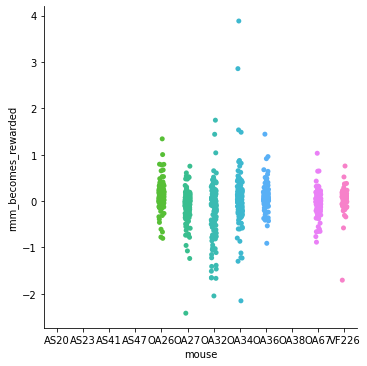

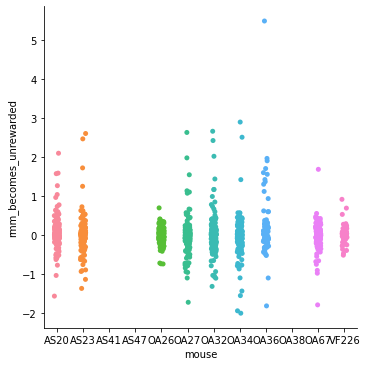

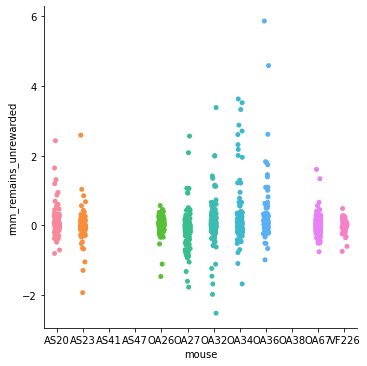

In [93]:
sns.catplot(data=rmm_df_all_mice, x='mouse', y='rmm_becomes_rewarded')
sns.catplot(data=rmm_df_all_mice, x='mouse', y='rmm_becomes_unrewarded')
sns.catplot(data=rmm_df_all_mice, x='mouse', y='rmm_remains_unrewarded')

In [135]:
tuning_list_LR_init[0].head()

staging_LR preferred tuning  \
mouse cell_n                               
AS20  1        learning    minus-neutral   
      1       reversal1    minus-neutral   
      2        learning    minus-neutral   
      2       reversal1       minus-plus   
      3        learning            broad   

                                                  cosine tuning  \
mouse cell_n                                                      
AS20  1       [0.18814802662058072, 0.5078259115711341, 0.68...   
      1       [0.173283506774627, 0.5926256281618041, 0.6119...   
      2       [0.2617321530529646, 0.39484569149883253, 0.70...   
      2       [0.20967973190429112, 0.7669953124199677, 0.43...   
      3       [0.4933776456452097, 0.42811702143167507, 0.35...   

                                                  mean response  \
mouse cell_n                                                      
AS20  1       [0.19121867699986278, 0.035653829857502845, -0...   
      1       [0.9179728905670892, 0.4096208618044614, 0.321...   
      2       [0.010768001917793521, -0.03860907489727616, -...   
      2       [0.6412183672981818, -0.012146381395101321, 0....   
      3       [0.10714639451807724, 0.1488172515690374, 0.20...   

              best component  offset component  offset cell  \
mouse cell_n                                                  
AS20  1                  1.0               1.0         True   
      1                  1.0               1.0         True   
      2                  1.0               1.0         True   
      2                  1.0               1.0         True   
      3                  1.0               1.0         True   

              component participation  offset participation  
mouse cell_n                                                 
AS20  1                             1                  True  
      1                             1                  True  
      2                             2                  True  
      2                             2                  True  
      3                             1                  True

In [335]:
new_tune = pd.concat(tuning_list_LR_init, axis=0)
new_tune = new_tune.loc[new_tune.staging_LR.isin(['learning']), :]
new_tune.head()

staging_LR preferred tuning  \
mouse cell_n                               
AS20  1        learning    minus-neutral   
      2        learning    minus-neutral   
      3        learning            broad   
      4        learning    minus-neutral   
      5        learning            broad   

                                                  cosine tuning  \
mouse cell_n                                                      
AS20  1       [0.18814802662058072, 0.5078259115711341, 0.68...   
      2       [0.2617321530529646, 0.39484569149883253, 0.70...   
      3       [0.4933776456452097, 0.42811702143167507, 0.35...   
      4       [0.3226643843282472, 0.38227079069360237, 0.60...   
      5       [0.3300130948430784, 0.4531311326292238, 0.497...   

                                                  mean response  \
mouse cell_n                                                      
AS20  1       [0.19121867699986278, 0.035653829857502845, -0...   
      2       [0.010768001917793521, -0.03860907489727616, -...   
      3       [0.10714639451807724, 0.1488172515690374, 0.20...   
      4       [0.017948952219971757, 0.029570951037672037, -...   
      5       [-0.06770671688445838, -0.1585930107660127, -0...   

              best component  offset component  offset cell  \
mouse cell_n                                                  
AS20  1                  1.0               1.0         True   
      2                  1.0               1.0         True   
      3                  1.0               1.0         True   
      4                  1.0               1.0         True   
      5                  1.0               1.0         True   

              component participation  offset participation  
mouse cell_n                                                 
AS20  1                             1                  True  
      2                             2                  True  
      3                             1                  True  
      4                             1                  True  
      5                             2                  True

In [337]:
lowspeed_pref = new_tune.merge(pref_rmm_df, how='left', left_on=['mouse', 'cell_n'], right_on=['mouse', 'cell_n'])
# lowspeed_pref.to_pickle(f'/twophoton_analysis/Data/analysis/Group-attractive/tuning_rmm_lowspeed_df.pkl')
# lowspeed_pref = pd.read_pickle(f'/twophoton_analysis/Data/analysis/Group-attractive/tuning_rmm_lowspeed_df.pkl')
lowspeed_pref.head()

staging_LR preferred tuning  \
mouse cell_n                               
AS20  1        learning    minus-neutral   
      2        learning    minus-neutral   
      3        learning            broad   
      4        learning    minus-neutral   
      5        learning            broad   

                                                  cosine tuning  \
mouse cell_n                                                      
AS20  1       [0.18814802662058072, 0.5078259115711341, 0.68...   
      2       [0.2617321530529646, 0.39484569149883253, 0.70...   
      3       [0.4933776456452097, 0.42811702143167507, 0.35...   
      4       [0.3226643843282472, 0.38227079069360237, 0.60...   
      5       [0.3300130948430784, 0.4531311326292238, 0.497...   

                                                  mean response  \
mouse cell_n                                                      
AS20  1       [0.19121867699986278, 0.035653829857502845, -0...   
      2       [0.010768001917793521, -0.03860907489727616, -...   
      3       [0.10714639451807724, 0.1488172515690374, 0.20...   
      4       [0.017948952219971757, 0.029570951037672037, -...   
      5       [-0.06770671688445838, -0.1585930107660127, -0...   

              best component  offset component  offset cell  \
mouse cell_n                                                  
AS20  1                  1.0               1.0         True   
      2                  1.0               1.0         True   
      3                  1.0               1.0         True   
      4                  1.0               1.0         True   
      5                  1.0               1.0         True   

              component participation  offset participation  pv_pref  rmm_pref  
mouse cell_n                                                                    
AS20  1                             1                  True    0.365 -0.160683  
      2                             2                  True    0.100  0.489648  
      3                             1                  True      NaN       NaN  
      4                             1                  True      NaN       NaN  
      5                             2                  True      NaN       NaN

In [140]:
all_needs = new_tune.merge(rmm_res, how='left', left_on=['mouse', 'cell_n'], right_on=['mouse', 'cell_n'])
all_needs.head()
# all_needs.to_pickle(f'/twophoton_analysis/Data/analysis/Group-attractive/tuning_rmm_df.pkl')

In [129]:
# do an outer merge over all mice
# mm1 = df_list[1].set_index(['mouse', 'cell_n'], drop=True).dropna(how='all')
mlist = []
for dfc in range(int(len(df_list)/3)):
    
    mm1 = df_list[1 + dfc*3].set_index(['mouse', 'cell_n'], drop=True).dropna(how='all') \
                .merge(df_list[0 + dfc*3].set_index(['mouse', 'cell_n'], drop=True).dropna(how='all'),
                      how='outer', left_on=['mouse', 'cell_n'], right_on=['mouse', 'cell_n'])\
                .merge(df_list[2 + dfc*3].set_index(['mouse', 'cell_n'], drop=True).dropna(how='all'),
                      how='outer', left_on=['mouse', 'cell_n'], right_on=['mouse', 'cell_n'])
    mlist.append(mm1)
rmm_res = pd.concat(mlist, axis=0)
rmm_res.head()

pv_becomes_unrewarded  rmm_becomes_unrewarded  \
mouse cell_n                                                  
AS20  1                       0.036                0.413162   
      2                       0.002                0.629498   
      6                       0.041                0.262825   
      9                       0.071                0.373098   
      10                      0.251                0.148364   

              pv_becomes_rewarded  rmm_becomes_rewarded  \
mouse cell_n                                              
AS20  1                       NaN                   NaN   
      2                       NaN                   NaN   
      6                       NaN                   NaN   
      9                       NaN                   NaN   
      10                      NaN                   NaN   

              pv_remains_unrewarded  rmm_remains_unrewarded  
mouse cell_n                                                 
AS20  1                       0.283               -0.166461  
      2                       0.115                0.328107  
      6                       0.491                0.002460  
      9                       0.388                0.070988  
      10                      0.210                0.130222

In [4]:
all_needs = pd.read_pickle(f'/twophoton_analysis/Data/analysis/Group-attractive/tuning_rmm_df.pkl')

<AxesSubplot:xlabel='rmm_becomes_rewarded', ylabel='rmm_remains_unrewarded'>

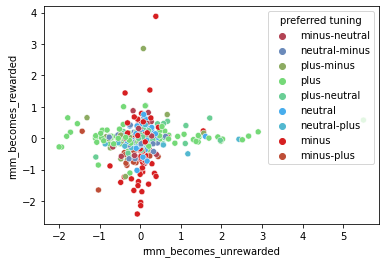

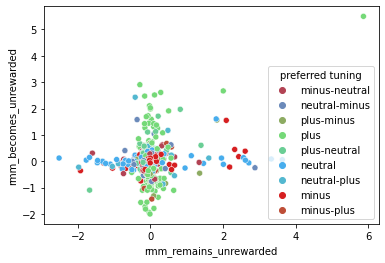

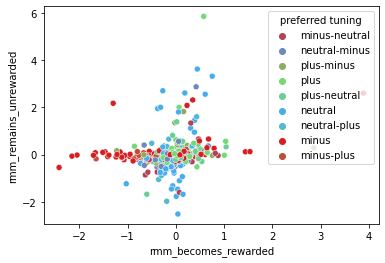

In [7]:
plt.figure()
aboo = all_needs.pv_becomes_unrewarded.lt(0.05)
bboo = all_needs.pv_becomes_rewarded.lt(0.05)
cboo = all_needs.rmm_remains_unrewarded.lt(0.05)
sigboo = aboo | bboo | cboo

broadboo = all_needs['preferred tuning'].isin(['broad'])

sns.scatterplot(data=all_needs.loc[sigboo & ~broadboo], x='rmm_becomes_unrewarded', y='rmm_becomes_rewarded',
                hue='preferred tuning', palette=cas.lookups.color_dict)
plt.figure()
sns.scatterplot(data=all_needs.loc[sigboo & ~broadboo], x='rmm_remains_unrewarded', y='rmm_becomes_unrewarded',
                hue='preferred tuning', palette=cas.lookups.color_dict)
plt.figure()
sns.scatterplot(data=all_needs.loc[sigboo & ~broadboo], x='rmm_becomes_rewarded', y='rmm_remains_unrewarded',
                hue='preferred tuning', palette=cas.lookups.color_dict)

In [9]:
all_needs.head()

staging_LR preferred tuning  \
mouse cell_n                               
AS20  1        learning    minus-neutral   
      2        learning    minus-neutral   
      3        learning            broad   
      4        learning    minus-neutral   
      5        learning            broad   

                                                  cosine tuning  \
mouse cell_n                                                      
AS20  1       [0.18814802662058072, 0.5078259115711341, 0.68...   
      2       [0.2617321530529646, 0.39484569149883253, 0.70...   
      3       [0.4933776456452097, 0.42811702143167507, 0.35...   
      4       [0.3226643843282472, 0.38227079069360237, 0.60...   
      5       [0.3300130948430784, 0.4531311326292238, 0.497...   

                                                  mean response  \
mouse cell_n                                                      
AS20  1       [0.19121867699986278, 0.035653829857502845, -0...   
      2       [0.010768001917793521, -0.03860907489727616, -...   
      3       [0.10714639451807724, 0.1488172515690374, 0.20...   
      4       [0.017948952219971757, 0.029570951037672037, -...   
      5       [-0.06770671688445838, -0.1585930107660127, -0...   

              best component  offset component  offset cell  \
mouse cell_n                                                  
AS20  1                  1.0               1.0         True   
      2                  1.0               1.0         True   
      3                  1.0               1.0         True   
      4                  1.0               1.0         True   
      5                  1.0               1.0         True   

              component participation  offset participation  \
mouse cell_n                                                  
AS20  1                             1                  True   
      2                             2                  True   
      3                             1                  True   
      4                             1                  True   
      5                             2                  True   

              pv_becomes_unrewarded  rmm_becomes_unrewarded  \
mouse cell_n                                                  
AS20  1                       0.036                0.413162   
      2                       0.002                0.629498   
      3                         NaN                     NaN   
      4                         NaN                     NaN   
      5                         NaN                     NaN   

              pv_becomes_rewarded  rmm_becomes_rewarded  \
mouse cell_n                                              
AS20  1                       NaN                   NaN   
      2                       NaN                   NaN   
      3                       NaN                   NaN   
      4                       NaN                   NaN   
      5                       NaN                   NaN   

              pv_remains_unrewarded  rmm_remains_unrewarded  
mouse cell_n                                                 
AS20  1                       0.283               -0.166461  
      2                       0.115                0.328107  
      3                         NaN                     NaN  
      4                         NaN                     NaN  
      5                         NaN                     NaN

## mismatch types by pre-rev cue preference 

started


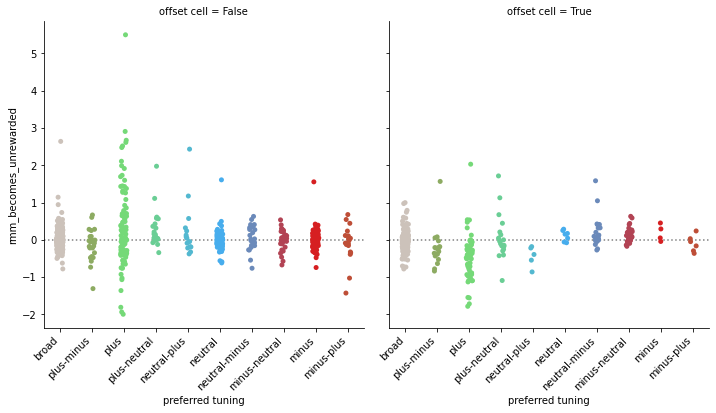

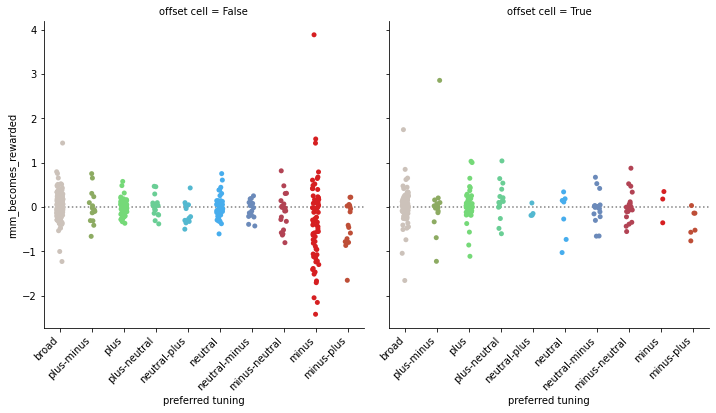

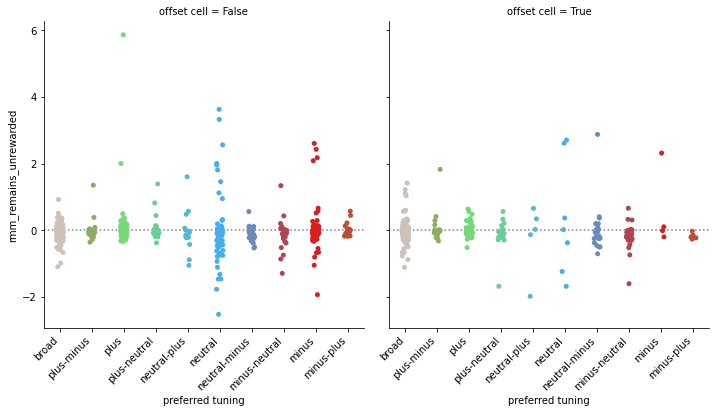

In [408]:
print('started')
g = sns.catplot(data=all_needs.loc[sigboo], y='rmm_becomes_unrewarded', x='preferred tuning',
            hue='preferred tuning', col='offset cell',
            order=cas.lookups.ax_order['cues'], palette=cas.lookups.color_dict)

for ax in g.axes.flatten():
    labels = ax.get_xticklabels()
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.axhline(0, linestyle=':', color='gray')
plt.savefig('/twophoton_analysis/Data/analysis/Group-attractive/mismatch_rmm_becomes_un.pdf')

g = sns.catplot(data=all_needs.loc[sigboo], y='rmm_becomes_rewarded', x='preferred tuning',
            hue='preferred tuning', col='offset cell',
            order=cas.lookups.ax_order['cues'], palette=cas.lookups.color_dict)

for ax in g.axes.flatten():
    labels = ax.get_xticklabels()
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.axhline(0, linestyle=':', color='gray')
plt.savefig('/twophoton_analysis/Data/analysis/Group-attractive/mismatch_rmm_becomes_rew.pdf')
    
g = sns.catplot(data=all_needs.loc[sigboo], y='rmm_remains_unrewarded', x='preferred tuning',
            hue='preferred tuning', col='offset cell',
            order=cas.lookups.ax_order['cues'], palette=cas.lookups.color_dict)

for ax in g.axes.flatten():
    labels = ax.get_xticklabels()
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.axhline(0, linestyle=':', color='gray')
plt.savefig('/twophoton_analysis/Data/analysis/Group-attractive/mismatch_rmm_remains_un.pdf')

In [295]:
all_needs.head()

staging_LR preferred tuning  \
mouse cell_n                               
AS20  1        learning    minus-neutral   
      2        learning    minus-neutral   
      3        learning            broad   
      4        learning    minus-neutral   
      5        learning            broad   

                                                  cosine tuning  \
mouse cell_n                                                      
AS20  1       [0.18814802662058072, 0.5078259115711341, 0.68...   
      2       [0.2617321530529646, 0.39484569149883253, 0.70...   
      3       [0.4933776456452097, 0.42811702143167507, 0.35...   
      4       [0.3226643843282472, 0.38227079069360237, 0.60...   
      5       [0.3300130948430784, 0.4531311326292238, 0.497...   

                                                  mean response  \
mouse cell_n                                                      
AS20  1       [0.19121867699986278, 0.035653829857502845, -0...   
      2       [0.010768001917793521, -0.03860907489727616, -...   
      3       [0.10714639451807724, 0.1488172515690374, 0.20...   
      4       [0.017948952219971757, 0.029570951037672037, -...   
      5       [-0.06770671688445838, -0.1585930107660127, -0...   

              best component  offset component  offset cell  \
mouse cell_n                                                  
AS20  1                  1.0               1.0         True   
      2                  1.0               1.0         True   
      3                  1.0               1.0         True   
      4                  1.0               1.0         True   
      5                  1.0               1.0         True   

              component participation  offset participation  \
mouse cell_n                                                  
AS20  1                             1                  True   
      2                             2                  True   
      3                             1                  True   
      4                             1                  True   
      5                             2                  True   

              pv_becomes_unrewarded  rmm_becomes_unrewarded  \
mouse cell_n                                                  
AS20  1                       0.036                0.413162   
      2                       0.002                0.629498   
      3                         NaN                     NaN   
      4                         NaN                     NaN   
      5                         NaN                     NaN   

              pv_becomes_rewarded  rmm_becomes_rewarded  \
mouse cell_n                                              
AS20  1                       NaN                   NaN   
      2                       NaN                   NaN   
      3                       NaN                   NaN   
      4                       NaN                   NaN   
      5                       NaN                   NaN   

              pv_remains_unrewarded  rmm_remains_unrewarded  
mouse cell_n                                                 
AS20  1                       0.283               -0.166461  
      2                       0.115                0.328107  
      3                         NaN                     NaN  
      4                         NaN                     NaN  
      5                         NaN                     NaN

<AxesSubplot:xlabel='RMM type', ylabel='fraction of cells'>

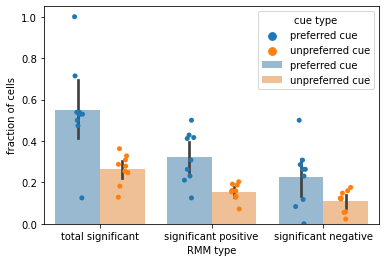

In [316]:
preferred_cue = []
rmm_type = []
rmm_frac = []

for mouse in all_needs.reset_index().mouse.unique():
    
    mouse_needs = all_needs.loc[all_needs.reset_index().mouse.isin([mouse]).values, :]
    mouse_needs = mouse_needs.loc[~mouse_needs['offset cell']]

    tot = (mouse_needs.pv_becomes_unrewarded.lt(0.05)
           & mouse_needs['preferred tuning'].isin(['plus'])).sum() \
           /  (mouse_needs.pv_becomes_unrewarded.notna() & mouse_needs['preferred tuning'].isin(['plus'])).sum()

    pos = (mouse_needs.pv_becomes_unrewarded.lt(0.05)
           & mouse_needs['preferred tuning'].isin(['plus'])
           & mouse_needs.rmm_becomes_unrewarded.gt(0)).sum() \
           /  (mouse_needs.pv_becomes_unrewarded.notna() & mouse_needs['preferred tuning'].isin(['plus'])).sum()

    neg = (mouse_needs.pv_becomes_unrewarded.lt(0.05)
           & mouse_needs['preferred tuning'].isin(['plus'])
           & mouse_needs.rmm_becomes_unrewarded.le(0)).sum() \
           /  (mouse_needs.pv_becomes_unrewarded.notna() & mouse_needs['preferred tuning'].isin(['plus'])).sum()

#     print(tot, pos, neg)
    for fr, ty in zip([tot, pos, neg], ['total significant', 'significant positive', 'significant negative']):
        rmm_frac.append(fr)
        rmm_type.append(ty)
        preferred_cue.append('preferred cue')
        

for mouse in all_needs.reset_index().mouse.unique():
    
    mouse_needs = all_needs.loc[all_needs.reset_index().mouse.isin([mouse]).values, :]
    mouse_needs = mouse_needs.loc[~mouse_needs['offset cell']]

    tot = (mouse_needs.pv_becomes_unrewarded.lt(0.05)
           & ~mouse_needs['preferred tuning'].isin(['plus'])).sum() \
           /  (mouse_needs.pv_becomes_unrewarded.notna() & ~mouse_needs['preferred tuning'].isin(['plus'])).sum()

    pos = (mouse_needs.pv_becomes_unrewarded.lt(0.05)
           & ~mouse_needs['preferred tuning'].isin(['plus'])
           & mouse_needs.rmm_becomes_unrewarded.gt(0)).sum() \
           /  (mouse_needs.pv_becomes_unrewarded.notna() & ~mouse_needs['preferred tuning'].isin(['plus'])).sum()

    neg = (mouse_needs.pv_becomes_unrewarded.lt(0.05)
           & ~mouse_needs['preferred tuning'].isin(['plus'])
           & mouse_needs.rmm_becomes_unrewarded.le(0)).sum() \
           /  (mouse_needs.pv_becomes_unrewarded.notna() & ~mouse_needs['preferred tuning'].isin(['plus'])).sum()

#     print(tot, pos, neg)
    for fr, ty in zip([tot, pos, neg], ['total significant', 'significant positive', 'significant negative']):
        rmm_frac.append(fr)
        rmm_type.append(ty)
        preferred_cue.append('unpreferred cue')
        
df = pd.DataFrame(data={'fraction of cells': rmm_frac, 'cue type': preferred_cue, 'RMM type': rmm_type})
        
fig, ax = plt.subplots(1,1)
sns.barplot(data=df, x='RMM type', y='fraction of cells', hue='cue type', dodge=True, ax=ax, alpha=0.5)
sns.stripplot(data=df, x='RMM type', y='fraction of cells', hue='cue type', dodge=True, ax=ax)

<AxesSubplot:xlabel='RMM type', ylabel='fraction of cells'>

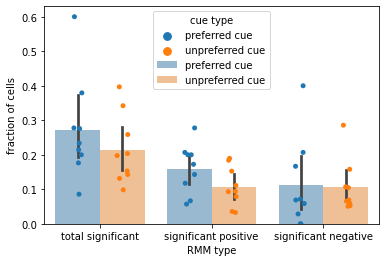

In [319]:
preferred_cue = []
rmm_type = []
rmm_frac = []

cue_set = ['minus', 'plus']
pv = 'pv_remains_unrewarded'
rmm = 'rmm_remains_unrewarded'

for mouse in all_needs.reset_index().mouse.unique():
    
    mouse_needs = all_needs.loc[all_needs.reset_index().mouse.isin([mouse]).values, :]
    mouse_needs = mouse_needs.loc[~mouse_needs['offset cell']]

    tot = (mouse_needs[pv].lt(0.05)
           & mouse_needs['preferred tuning'].isin(cue_set)).sum() \
           /  (mouse_needs[pv].notna() & mouse_needs['preferred tuning'].isin(cue_set)).sum()

    pos = (mouse_needs[pv].lt(0.05)
           & mouse_needs['preferred tuning'].isin(cue_set)
           & mouse_needs[rmm].gt(0)).sum() \
           /  (mouse_needs[pv].notna() & mouse_needs['preferred tuning'].isin(cue_set)).sum()

    neg = (mouse_needs[pv].lt(0.05)
           & mouse_needs['preferred tuning'].isin(cue_set)
           & mouse_needs[rmm].le(0)).sum() \
           /  (mouse_needs[pv].notna() & mouse_needs['preferred tuning'].isin(cue_set)).sum()

#     print(tot, pos, neg)
    for fr, ty in zip([tot, pos, neg], ['total significant', 'significant positive', 'significant negative']):
        rmm_frac.append(fr)
        rmm_type.append(ty)
        preferred_cue.append('preferred cue')
        

for mouse in all_needs.reset_index().mouse.unique():
    
    mouse_needs = all_needs.loc[all_needs.reset_index().mouse.isin([mouse]).values, :]
    mouse_needs = mouse_needs.loc[~mouse_needs['offset cell']]

    tot = (mouse_needs[pv].lt(0.05)
           & ~mouse_needs['preferred tuning'].isin(cue_set)).sum() \
           /  (mouse_needs[pv].notna() & ~mouse_needs['preferred tuning'].isin(cue_set)).sum()

    pos = (mouse_needs[pv].lt(0.05)
           & ~mouse_needs['preferred tuning'].isin(cue_set)
           & mouse_needs[rmm].gt(0)).sum() \
           /  (mouse_needs[pv].notna() & ~mouse_needs['preferred tuning'].isin(cue_set)).sum()

    neg = (mouse_needs[pv].lt(0.05)
           & ~mouse_needs['preferred tuning'].isin(cue_set)
           & mouse_needs[rmm].le(0)).sum() \
           /  (mouse_needs[pv].notna() & ~mouse_needs['preferred tuning'].isin(cue_set)).sum()

#     print(tot, pos, neg)
    for fr, ty in zip([tot, pos, neg], ['total significant', 'significant positive', 'significant negative']):
        rmm_frac.append(fr)
        rmm_type.append(ty)
        preferred_cue.append('unpreferred cue')
        
df = pd.DataFrame(data={'fraction of cells': rmm_frac, 'cue type': preferred_cue, 'RMM type': rmm_type})
        
fig, ax = plt.subplots(1,1)
sns.barplot(data=df, x='RMM type', y='fraction of cells', hue='cue type', dodge=True, ax=ax, alpha=0.5)
sns.stripplot(data=df, x='RMM type', y='fraction of cells', hue='cue type', dodge=True, ax=ax)

started


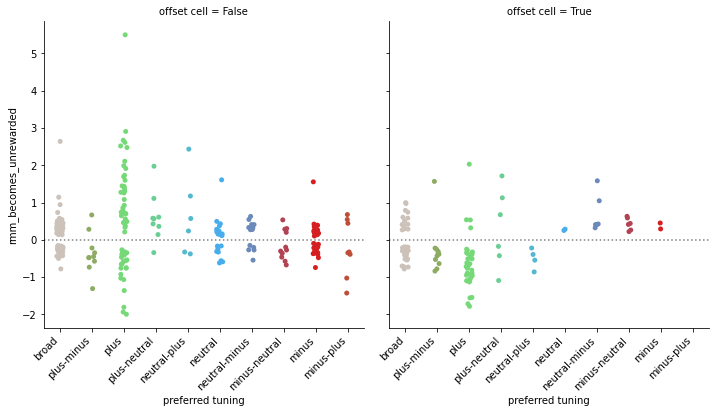

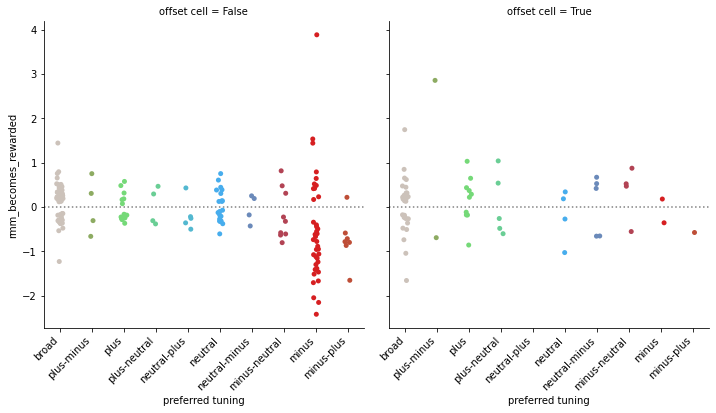

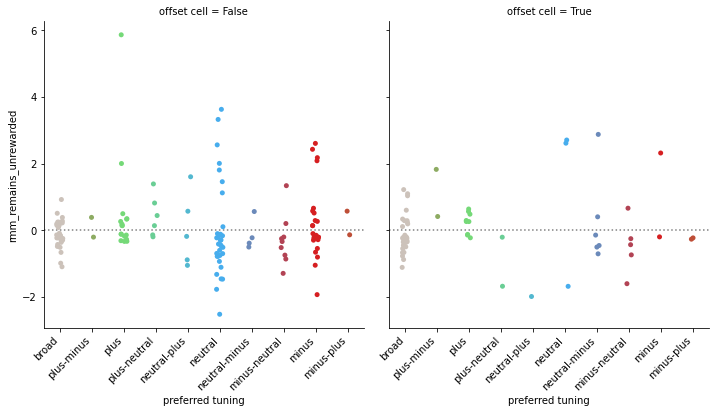

In [409]:
print('started')
mis_boo = all_needs.pv_becomes_unrewarded.lt(0.05)
g = sns.catplot(data=all_needs.loc[sigboo & mis_boo], y='rmm_becomes_unrewarded', x='preferred tuning',
            hue='preferred tuning', col='offset cell',
            order=cas.lookups.ax_order['cues'], palette=cas.lookups.color_dict)

for ax in g.axes.flatten():
    labels = ax.get_xticklabels()
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.axhline(0, linestyle=':', color='gray')
plt.savefig('/twophoton_analysis/Data/analysis/Group-attractive/mismatch_rmm_SIG_becomes_un.pdf')

mis_boo = all_needs.pv_becomes_rewarded.lt(0.05)
g = sns.catplot(data=all_needs.loc[sigboo & mis_boo], y='rmm_becomes_rewarded', x='preferred tuning',
            hue='preferred tuning', col='offset cell',
            order=cas.lookups.ax_order['cues'], palette=cas.lookups.color_dict)

for ax in g.axes.flatten():
    labels = ax.get_xticklabels()
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.axhline(0, linestyle=':', color='gray')
plt.savefig('/twophoton_analysis/Data/analysis/Group-attractive/mismatch_rmm_SIG_becomes_rew.pdf')

mis_boo = all_needs.pv_remains_unrewarded.lt(0.05)
g = sns.catplot(data=all_needs.loc[sigboo & mis_boo], y='rmm_remains_unrewarded', x='preferred tuning',
            hue='preferred tuning', col='offset cell',
            order=cas.lookups.ax_order['cues'], palette=cas.lookups.color_dict)

for ax in g.axes.flatten():
    labels = ax.get_xticklabels()
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.axhline(0, linestyle=':', color='gray')
plt.savefig('/twophoton_analysis/Data/analysis/Group-attractive/mismatch_rmm_SIG_remains_un.pdf')

## plot mismatch against other indices

In [292]:
# stable_w_index.to_pickle('/twophoton_analysis/Data/analysis/Group-attractive/stability/inds_mod_rmm_matchedrunning.pkl')

In [387]:
stable_mice_df = pd.read_pickle('/twophoton_analysis/Data/analysis/Group-attractive/stability/indices_and_modulation_windex.pkl')
stable_mice_df.head()

stage  half_peak      peak  half_peak_jitter   s_index  \
mouse cell_n                                                              
AS20  1       L0 naive        NaN       NaN               NaN       NaN   
      2       L0 naive   0.258065  0.451613          0.260136  0.617358   
      3       L0 naive   0.387097  0.645161          0.375675  0.614778   
      4       L0 naive   0.258065  0.387097          0.232964  0.602758   
      5       L0 naive   0.258065  0.451613          0.248797  0.669396   

              corr_all  corr_pop  run_corr  fano_d_cap2    fano_d  \
mouse cell_n                                                        
AS20  1            NaN       NaN       NaN     0.360571  0.360571   
      2       0.798923 -0.153219 -0.185397     0.360571  0.360571   
      3       0.650534 -0.181495 -0.185397     0.360571  0.360571   
      4       0.799019 -0.002020 -0.185397     0.360571  0.360571   
      5       0.518728 -0.175244 -0.009810     0.360571  0.360571   

              fano_tr_cap2    fano_tr  sensory_history  punish_history  \
mouse cell_n                                                             
AS20  1                NaN        NaN              NaN             NaN   
      2                2.0   4.401793        -1.026985             NaN   
      3                2.0  10.858213        -0.101251       -0.405096   
      4                2.0   3.702963         0.596884       -0.599350   
      5                2.0  79.067858        -0.028797        0.053697   

              running_mod  licking_mod  lick_corr  lick_ons_corr  offvec  \
mouse cell_n                                                               
AS20  1               NaN          NaN        NaN            NaN    True   
      2          1.000000     2.140332   0.012052      -0.065048    True   
      3          0.691611     0.002525   0.012052      -0.065048    True   
      4          0.047423    -0.172619   0.012052      -0.065048    True   
      5          1.000000    -0.013179   0.004102       0.102789    True   

              stages  
mouse cell_n          
AS20  1          1.0  
      2          2.0  
      3          3.0  
      4          4.0  
      5          5.0

<AxesSubplot:xlabel='stage', ylabel='s_index'>

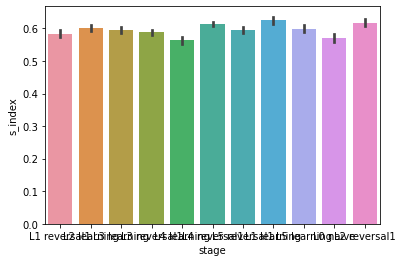

In [392]:
test = stable_mice_df.set_index('stage', append=True).groupby(['mouse', 'cell_n', 'stage']).mean()
sns.barplot(data=test.loc[~test.offvec].reset_index(), x='stage', y='s_index')

In [224]:
stable_index = []
for meta, tensor in zip(meta_list, tensor_list):
    
    mouse = meta.reset_index()['mouse'].unique()[0]

    df = pd.DataFrame(data={'mouse': [mouse] * tensor.shape[0]*11,
                            'cell_n': np.hstack([np.arange(tensor.shape[0]) + 1 for s in range(11)]).flatten(),
                            'stage': np.hstack([[s] * tensor.shape[0] for s in cas.lookups.staging['parsed_11stage']]).flatten()})
    stable_index.append(df)
stable_index = pd.concat(stable_index, axis=0)

In [229]:
stable_w_index = pd.concat([stable_index, stable_mice_df], axis=1).set_index(['mouse', 'cell_n'])
stable_w_index.head()

stage  half_peak      peak  half_peak_jitter   s_index  \
mouse cell_n                                                              
AS20  1       L0 naive        NaN       NaN               NaN       NaN   
      2       L0 naive   0.258065  0.451613          0.260136  0.617358   
      3       L0 naive   0.387097  0.645161          0.375675  0.614778   
      4       L0 naive   0.258065  0.387097          0.232964  0.602758   
      5       L0 naive   0.258065  0.451613          0.248797  0.669396   

              corr_all  corr_pop  run_corr  fano_d_cap2    fano_d  \
mouse cell_n                                                        
AS20  1            NaN       NaN       NaN     0.360571  0.360571   
      2       0.798923 -0.153219 -0.185397     0.360571  0.360571   
      3       0.650534 -0.181495 -0.185397     0.360571  0.360571   
      4       0.799019 -0.002020 -0.185397     0.360571  0.360571   
      5       0.518728 -0.175244 -0.009810     0.360571  0.360571   

              fano_tr_cap2    fano_tr  sensory_history  punish_history  \
mouse cell_n                                                             
AS20  1                NaN        NaN              NaN             NaN   
      2                2.0   4.401793        -1.026985             NaN   
      3                2.0  10.858213        -0.101251       -0.405096   
      4                2.0   3.702963         0.596884       -0.599350   
      5                2.0  79.067858        -0.028797        0.053697   

              running_mod  licking_mod  lick_corr  lick_ons_corr  offvec  \
mouse cell_n                                                               
AS20  1               NaN          NaN        NaN            NaN    True   
      2          1.000000     2.140332   0.012052      -0.065048    True   
      3          0.691611     0.002525   0.012052      -0.065048    True   
      4          0.047423    -0.172619   0.012052      -0.065048    True   
      5          1.000000    -0.013179   0.004102       0.102789    True   

              stages  
mouse cell_n          
AS20  1          1.0  
      2          2.0  
      3          3.0  
      4          4.0  
      5          5.0

In [340]:
stable_w_index.to_pickle('/twophoton_analysis/Data/analysis/Group-attractive/stability/indices_and_modulation_windex.pkl')

In [233]:
all_needs.head()

staging_LR preferred tuning  \
mouse cell_n                               
AS20  1        learning    minus-neutral   
      2        learning    minus-neutral   
      3        learning            broad   
      4        learning    minus-neutral   
      5        learning            broad   

                                                  cosine tuning  \
mouse cell_n                                                      
AS20  1       [0.18814802662058072, 0.5078259115711341, 0.68...   
      2       [0.2617321530529646, 0.39484569149883253, 0.70...   
      3       [0.4933776456452097, 0.42811702143167507, 0.35...   
      4       [0.3226643843282472, 0.38227079069360237, 0.60...   
      5       [0.3300130948430784, 0.4531311326292238, 0.497...   

                                                  mean response  \
mouse cell_n                                                      
AS20  1       [0.19121867699986278, 0.035653829857502845, -0...   
      2       [0.010768001917793521, -0.03860907489727616, -...   
      3       [0.10714639451807724, 0.1488172515690374, 0.20...   
      4       [0.017948952219971757, 0.029570951037672037, -...   
      5       [-0.06770671688445838, -0.1585930107660127, -0...   

              best component  offset component  offset cell  \
mouse cell_n                                                  
AS20  1                  1.0               1.0         True   
      2                  1.0               1.0         True   
      3                  1.0               1.0         True   
      4                  1.0               1.0         True   
      5                  1.0               1.0         True   

              component participation  offset participation  \
mouse cell_n                                                  
AS20  1                             1                  True   
      2                             2                  True   
      3                             1                  True   
      4                             1                  True   
      5                             2                  True   

              pv_becomes_unrewarded  rmm_becomes_unrewarded  \
mouse cell_n                                                  
AS20  1                       0.036                0.413162   
      2                       0.002                0.629498   
      3                         NaN                     NaN   
      4                         NaN                     NaN   
      5                         NaN                     NaN   

              pv_becomes_rewarded  rmm_becomes_rewarded  \
mouse cell_n                                              
AS20  1                       NaN                   NaN   
      2                       NaN                   NaN   
      3                       NaN                   NaN   
      4                       NaN                   NaN   
      5                       NaN                   NaN   

              pv_remains_unrewarded  rmm_remains_unrewarded  
mouse cell_n                                                 
AS20  1                       0.283               -0.166461  
      2                       0.115                0.328107  
      3                         NaN                     NaN  
      4                         NaN                     NaN  
      5                         NaN                     NaN

In [430]:
whole_frame.head()

stage  half_peak      peak  half_peak_jitter   s_index  \
mouse cell_n                                                                 
AS20  1          L0 naive        NaN       NaN               NaN       NaN   
      1       L1 learning        NaN       NaN               NaN       NaN   
      1       L2 learning   0.064516  0.322581          0.077436  0.794455   
      1       L3 learning   0.451613  0.580645          0.458539  0.602626   
      1       L4 learning        NaN       NaN               NaN  0.634662   

              corr_all  corr_pop  run_corr  fano_d_cap2    fano_d  ...  \
mouse cell_n                                                       ...   
AS20  1            NaN       NaN       NaN     0.360571  0.360571  ...   
      1            NaN       NaN       NaN          NaN       NaN  ...   
      1       0.845827  0.287508 -0.000842     0.475563  0.475563  ...   
      1       0.952510  0.330853 -0.284279     0.098034  0.098034  ...   
      1       0.965867  0.477676  0.248225     0.448698  0.448698  ...   

              offset component  offset cell  component participation  \
mouse cell_n                                                           
AS20  1                    1.0         True                        1   
      1                    1.0         True                        1   
      1                    1.0         True                        1   
      1                    1.0         True                        1   
      1                    1.0         True                        1   

              offset participation  pv_becomes_unrewarded  \
mouse cell_n                                                
AS20  1                       True                  0.036   
      1                       True                  0.036   
      1                       True                  0.036   
      1                       True                  0.036   
      1                       True                  0.036   

              rmm_becomes_unrewarded  pv_becomes_rewarded  \
mouse cell_n                                                
AS20  1                     0.413162                  NaN   
      1                     0.413162                  NaN   
      1                     0.413162                  NaN   
      1                     0.413162                  NaN   
      1                     0.413162                  NaN   

              rmm_becomes_rewarded  pv_remains_unrewarded  \
mouse cell_n                                                
AS20  1                        NaN                  0.283   
      1                        NaN                  0.283   
      1                        NaN                  0.283   
      1                        NaN                  0.283   
      1                        NaN                  0.283   

              rmm_remains_unrewarded  
mouse cell_n                          
AS20  1                    -0.166461  
      1                    -0.166461  
      1                    -0.166461  
      1                    -0.166461  
      1                    -0.166461  

[5 rows x 35 columns]

Text(0.5, 1.0, 'Shortest cosine distance (best tuning) across learning: All cells')

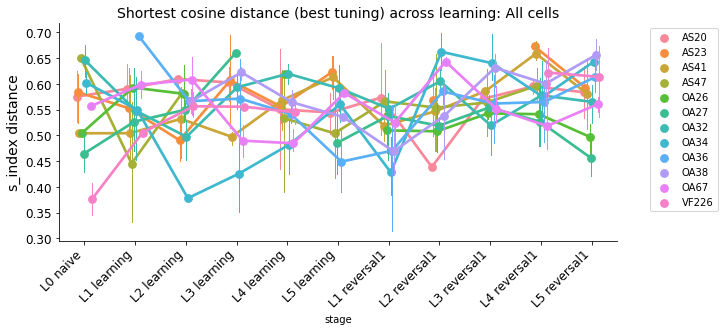

In [429]:
# whole_frame
test2 = (whole_frame.loc[~whole_frame.offvec
                         & whole_frame['preferred tuning'].isin(['plus', 'plus-minus', 'plus-neutral'])
                         & whole_frame['s_index'].lt(0.7)
                         & whole_frame['s_index'].gt(0.3)
                        ]
         .groupby(['mouse', 'stage', 'preferred tuning']).mean()
        )

# filter on cells that are transient l5 vs r1

xorder = ['L0 naive',
          'L1 learning', 'L2 learning', 'L3 learning', 'L4 learning', 'L5 learning',
          'L1 reversal1', 'L2 reversal1', 'L3 reversal1', 'L4 reversal1', 'L5 reversal1']

plt.figure(figsize=(10,4))
sns.pointplot(data=test2.reset_index(), x='stage', y='s_index', hue='mouse',
       order=xorder, errwidth=1, dodge=True) #      palette=cas.lookups.color_dict,
plt.legend(loc=2, bbox_to_anchor=(1.05, 1.0))
plt.xticks(rotation=45, ha='right', size=12)
sns.despine()
plt.yticks(size=12)
plt.ylabel('s_index distance', size=14)
plt.title('Shortest cosine distance (best tuning) across learning: All cells', size=14)
# plt.savefig('/twophoton_analysis/Data/analysis/Group-attractive/sindex_bars_ALL.png', bbox_inches='tight')

Text(0.5, 1.0, 'Latency to peak')

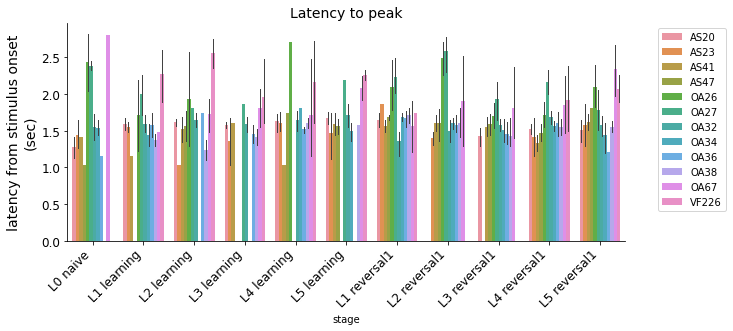

In [431]:
# whole_frame
test2 = (whole_frame.loc[~whole_frame.offvec & ~whole_frame['preferred tuning'].isin(['broad', 'none']) & whole_frame['peak'].gt(1)]
         .groupby(['mouse', 'stage', 'preferred tuning']).mean())

xorder = ['L0 naive',
          'L1 learning', 'L2 learning', 'L3 learning', 'L4 learning', 'L5 learning',
          'L1 reversal1', 'L2 reversal1', 'L3 reversal1', 'L4 reversal1', 'L5 reversal1']

plt.figure(figsize=(10,4))
sns.barplot(data=test2.reset_index(), x='stage', y='peak', hue='mouse',  #palette=cas.lookups.color_dict
            order=xorder, errwidth=1, dodge=True)
plt.legend(loc=2, bbox_to_anchor=(1.05, 1.0))
plt.xticks(rotation=45, ha='right', size=12)
sns.despine()
plt.yticks(size=12)
plt.ylabel('latency from stimulus onset\n(sec)', size=14)
plt.title('Latency to peak', size=14)
# plt.savefig('/twophoton_analysis/Data/analysis/Group-attractive/sindex_bars_ALL.png', bbox_inches='tight')

In [236]:
whole_frame = stable_w_index.join(all_needs, how='left')
whole_frame.shape

(58718, 35)

In [342]:
whole_lowspeed = stable_w_index.join(lowspeed_pref, how='left')
print(whole_lowspeed.shape)
whole_lowspeed.head()

(58718, 31)


stage  half_peak      peak  half_peak_jitter   s_index  \
mouse cell_n                                                                 
AS20  1          L0 naive        NaN       NaN               NaN       NaN   
      1       L1 learning        NaN       NaN               NaN       NaN   
      1       L2 learning   0.064516  0.322581          0.077436  0.794455   
      1       L3 learning   0.451613  0.580645          0.458539  0.602626   
      1       L4 learning        NaN       NaN               NaN  0.634662   

              corr_all  corr_pop  run_corr  fano_d_cap2    fano_d  ...  \
mouse cell_n                                                       ...   
AS20  1            NaN       NaN       NaN     0.360571  0.360571  ...   
      1            NaN       NaN       NaN          NaN       NaN  ...   
      1       0.845827  0.287508 -0.000842     0.475563  0.475563  ...   
      1       0.952510  0.330853 -0.284279     0.098034  0.098034  ...   
      1       0.965867  0.477676  0.248225     0.448698  0.448698  ...   

              preferred tuning  \
mouse cell_n                     
AS20  1          minus-neutral   
      1          minus-neutral   
      1          minus-neutral   
      1          minus-neutral   
      1          minus-neutral   

                                                  cosine tuning  \
mouse cell_n                                                      
AS20  1       [0.18814802662058072, 0.5078259115711341, 0.68...   
      1       [0.18814802662058072, 0.5078259115711341, 0.68...   
      1       [0.18814802662058072, 0.5078259115711341, 0.68...   
      1       [0.18814802662058072, 0.5078259115711341, 0.68...   
      1       [0.18814802662058072, 0.5078259115711341, 0.68...   

                                                  mean response  \
mouse cell_n                                                      
AS20  1       [0.19121867699986278, 0.035653829857502845, -0...   
      1       [0.19121867699986278, 0.035653829857502845, -0...   
      1       [0.19121867699986278, 0.035653829857502845, -0...   
      1       [0.19121867699986278, 0.035653829857502845, -0...   
      1       [0.19121867699986278, 0.035653829857502845, -0...   

              best component  offset component  offset cell  \
mouse cell_n                                                  
AS20  1                  1.0               1.0         True   
      1                  1.0               1.0         True   
      1                  1.0               1.0         True   
      1                  1.0               1.0         True   
      1                  1.0               1.0         True   

              component participation  offset participation  pv_pref  rmm_pref  
mouse cell_n                                                                    
AS20  1                             1                  True    0.365 -0.160683  
      1                             1                  True    0.365 -0.160683  
      1                             1                  True    0.365 -0.160683  
      1                             1                  True    0.365 -0.160683  
      1                             1                  True    0.365 -0.160683  

[5 rows x 31 columns]

In [343]:
whole_lowspeed.columns

Index(['stage', 'half_peak', 'peak', 'half_peak_jitter', 's_index', 'corr_all',
       'corr_pop', 'run_corr', 'fano_d_cap2', 'fano_d', 'fano_tr_cap2',
       'fano_tr', 'sensory_history', 'punish_history', 'running_mod',
       'licking_mod', 'lick_corr', 'lick_ons_corr', 'offvec', 'stages',
       'staging_LR', 'preferred tuning', 'cosine tuning', 'mean response',
       'best component', 'offset component', 'offset cell',
       'component participation', 'offset participation', 'pv_pref',
       'rmm_pref'],
      dtype='object')

# LOWSPEED SCATTER

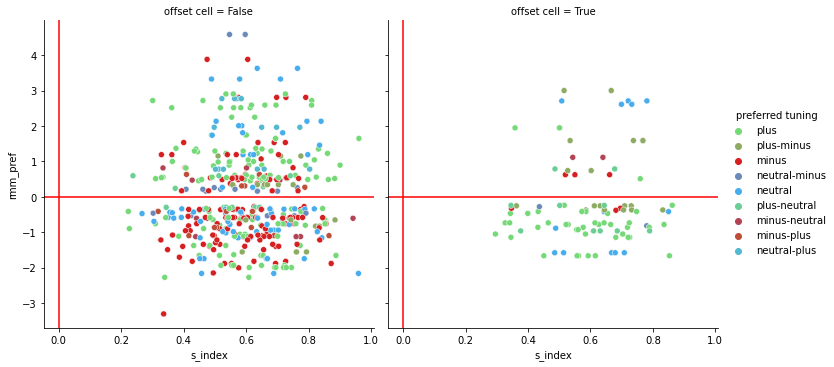

In [348]:

g = sns.relplot(data=whole_lowspeed.loc[whole_lowspeed.pv_pref.lt(0.05)],
            y='rmm_pref', x='s_index', hue='preferred tuning', col='offset cell', palette=cas.lookups.color_dict)

for ax in g.axes.flatten():
    ax.axhline(0, color='red')
    ax.axvline(0, color='red')

## ALL CUE MATCH RUNNING scatter against mismatch

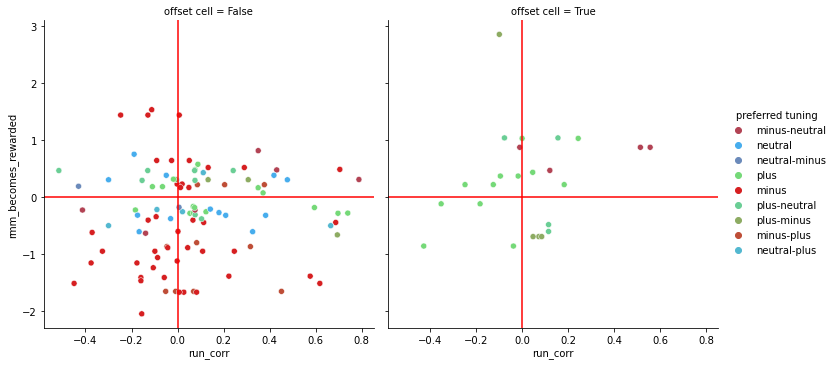

In [291]:
rev_type_pv = 'pv_becomes_unrewarded'
rev_type = 'rmm_becomes_unrewarded'
# rev_type_pv = 'pv_remains_unrewarded'
# rev_type = 'rmm_remains_unrewarded'
rev_type_pv = 'pv_becomes_rewarded'
rev_type = 'rmm_becomes_rewarded'

data_to_plot = whole_frame.loc[ whole_frame.stage.isin(['L1 learning', 'L2 learning', 'L3 learning', 'L4 learning','L5 learning']) 
#                                 ~whole_frame['offset cell']
                               & whole_frame[rev_type_pv].lt(0.05)
                               & ~whole_frame['preferred tuning'].isin(['broad'])
                              ]

g = sns.relplot(data=data_to_plot,
            y=rev_type, x='run_corr', hue='preferred tuning', col='offset cell', palette=cas.lookups.color_dict)

for ax in g.axes.flatten():
    ax.axhline(0, color='red')
    ax.axvline(0, color='red')

## get mismatch traces

In [47]:
# rc_reversal_mismatch_list = []
# pval_rc_boot_list = []
trace_list = []
for meta, tensor in zip(meta_list, tensor_list):
    
    meta = utils.add_reversal_mismatch_condition_to_meta(meta)
    mouse = meta.reset_index().mouse.unique()[0]
    
    if mouse not in ['OA27']:
        continue
    
    for rev_type in ['becomes_rewarded', 'becomes_unrewarded', 'remains_unrewarded']:
        
        boo_vec = ~meta.mismatch_condition.isin([rev_type]).values
        
        blanked_tensor = deepcopy(tensor)
        blanked_tensor[:,:,boo_vec] = np.nan
    
        trace_set = cas.mismatch.run_controlled_reversal_mismatch_traces(meta, blanked_tensor, filter_hmm_engaged=True, boot=True)
    
#         df = pd.DataFrame(data={'mouse': [mouse] * len(pv),
#                                 'cell_n': [int(s + 1) for s in np.arange(len(pv))],
#                                 f'pv_{rev_type}': pv,
#                                 f'rmm_{rev_type}': rev_rc
#                                 }
#                          )
        trace_list.append(trace_set)
# rmm_df_all_mice = pd.concat(df_list, axis=0)

OA27: pre-rev: 725, post-rev: 100
  -->  OA27: pre-rev: 711, post-rev: 100


s:\twophoton_analysis\code\cascade\cascade\utils.py:1810: RuntimeWarning: Mean of empty slice
  binned_set1[:, :, bc] = np.nanmean(set1_tensor[:, :, bin_trials1], axis=1)
D:\Anaconda3\lib\site-packages\numpy\lib\nanfunctions.py:1628: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
s:\twophoton_analysis\code\cascade\cascade\mismatch.py:119: RuntimeWarning: Mean of empty slice
  simple_pre_mean = np.nanmean(pref_tensor[:, :, (rev_day & pre_rev)], axis=2)
s:\twophoton_analysis\code\cascade\cascade\mismatch.py:120: RuntimeWarning: Mean of empty slice
  simple_post_mean = np.nanmean(pref_tensor[:, :, (rev_day & post_rev)], axis=2)
s:\twophoton_analysis\code\cascade\cascade\mismatch.py:121: RuntimeWarning: Mean of empty slice
  reversal_mismatch = np.nanmean(post_bins - pre_bins, axis=2)
s:\twophoton_analysis\code\cascade\cascade\mismatch.py:122: RuntimeWarning: Mean of empty slice
  pre_collapse_bins = np.nanmean(pre_bins, axis=2)
s:\twophoton_analysis\code\cascade\c

OA27: pre-rev: 725, post-rev: 100
  -->  OA27: pre-rev: 711, post-rev: 100
OA27: pre-rev: 725, post-rev: 100
  -->  OA27: pre-rev: 711, post-rev: 100


In [51]:
OA27_needs = all_needs.loc[all_needs.reset_index().mouse.isin(['OA27']).values, :]
print(OA27_needs.shape)
OA27_needs.head()

(616, 15)


staging_LR preferred tuning  \
mouse cell_n                               
OA27  1        learning            broad   
      2        learning    minus-neutral   
      3        learning            broad   
      4        learning            minus   
      5        learning       minus-plus   

                                                  cosine tuning  \
mouse cell_n                                                      
OA27  1       [0.5090395480000549, 0.2537348611522535, 0.550...   
      2       [0.3252515904534121, 0.347056258617341, 0.6559...   
      3       [0.40176674500165943, 0.472168223461258, 0.397...   
      4       [0.08712720446357425, 0.7347767336256898, 0.68...   
      5       [0.12502190757321308, 0.7763494935035532, 0.57...   

                                                  mean response  \
mouse cell_n                                                      
OA27  1       [0.6122328152318932, 0.9487745347379299, 0.512...   
      2       [0.4391381237190954, 0.4042392194366115, 0.168...   
      3       [0.23202628582578047, 0.17548600963618785, 0.2...   
      4       [0.34694902042143955, 0.01701711231400029, 0.0...   
      5       [0.4062437670496977, 0.01999943584724617, 0.16...   

              best component  offset component  offset cell  \
mouse cell_n                                                  
OA27  1                  1.0               1.0         True   
      2                  1.0               1.0         True   
      3                  1.0               1.0         True   
      4                  1.0               1.0         True   
      5                  1.0               1.0         True   

              component participation  offset participation  \
mouse cell_n                                                  
OA27  1                             2                  True   
      2                             1                  True   
      3                             3                  True   
      4                             1                  True   
      5                             4                  True   

              pv_becomes_unrewarded  rmm_becomes_unrewarded  \
mouse cell_n                                                  
OA27  1                         NaN                     NaN   
      2                       0.181                0.209594   
      3                       0.317               -0.079507   
      4                         NaN                     NaN   
      5                         NaN                     NaN   

              pv_becomes_rewarded  rmm_becomes_rewarded  \
mouse cell_n                                              
OA27  1                       NaN                   NaN   
      2                     0.079             -0.432560   
      3                     0.373             -0.095836   
      4                       NaN                   NaN   
      5                       NaN                   NaN   

              pv_remains_unrewarded  rmm_remains_unrewarded  
mouse cell_n                                                 
OA27  1                         NaN                     NaN  
      2                       0.170               -0.295195  
      3                       0.087               -0.284579  
      4                         NaN                     NaN  
      5                         NaN                     NaN

<AxesSubplot:>

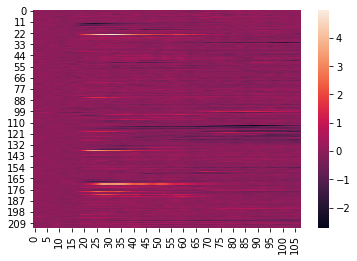

In [123]:
plt.figure()
bunr = trace_list[1][0]
bunr = bunr[~np.isnan(bunr[:, 0]), :]
sns.heatmap(bunr)

<AxesSubplot:>

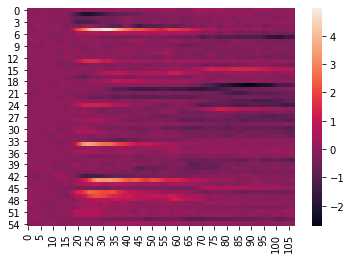

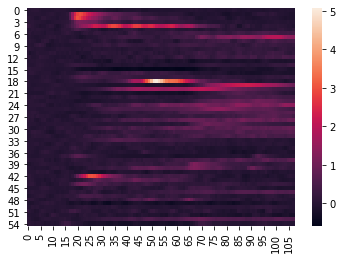

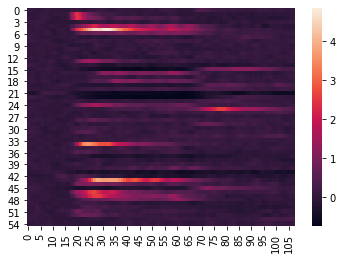

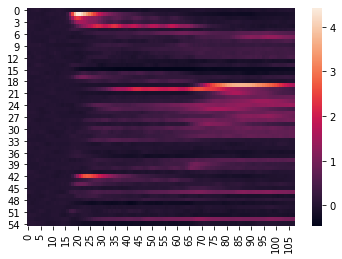

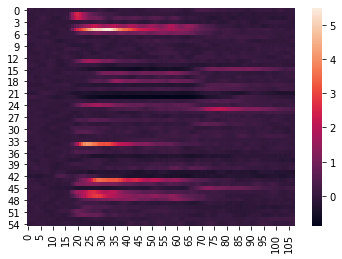

In [56]:
# ['becomes_rewarded', 'becomes_unrewarded', 'remains_unrewarded']
# [reversal_mismatch, pre_collapse_bins, post_collapse_bins, pre_sem, post_sem, simple_pre_mean, simple_post_mean]

trace_list[1][0].shape
plt.figure()
sns.heatmap(trace_list[1][0][OA27_needs.pv_becomes_unrewarded.lt(0.05).values, :])

plt.figure()
sns.heatmap(trace_list[1][1][OA27_needs.pv_becomes_unrewarded.lt(0.05).values, :])

plt.figure()
sns.heatmap(trace_list[1][2][OA27_needs.pv_becomes_unrewarded.lt(0.05).values, :])

plt.figure()
sns.heatmap(trace_list[1][5][OA27_needs.pv_becomes_unrewarded.lt(0.05).values, :])

plt.figure()
sns.heatmap(trace_list[1][6][OA27_needs.pv_becomes_unrewarded.lt(0.05).values, :])

In [73]:
np.arange(15.5, 108, 15.5)

array([15.5, 31. , 46.5, 62. , 77.5, 93. ])

# significant

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


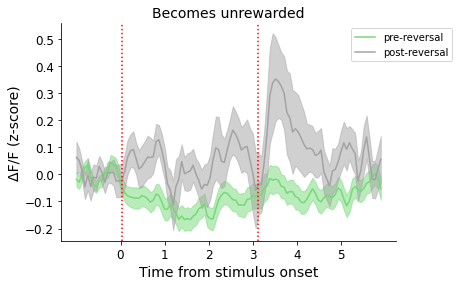

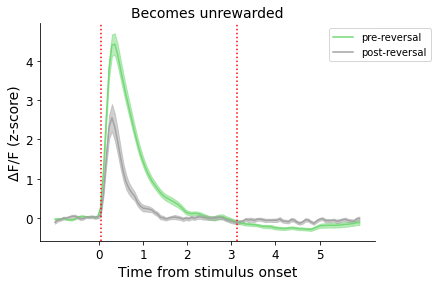

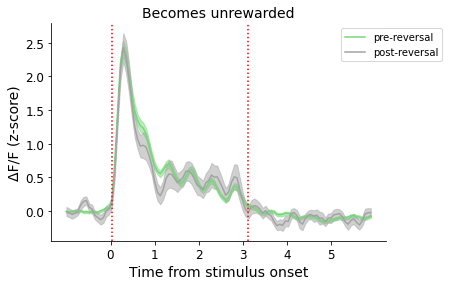

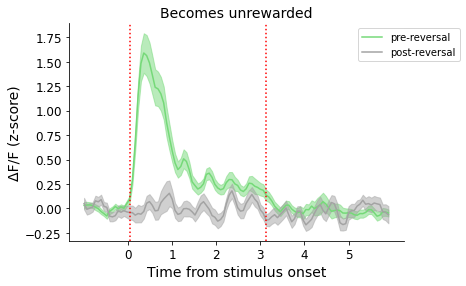

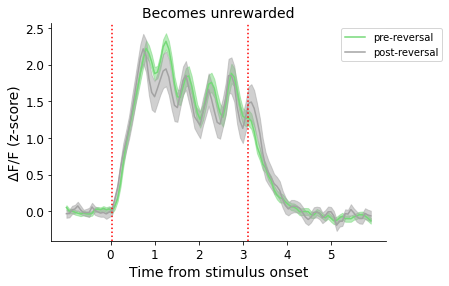

...

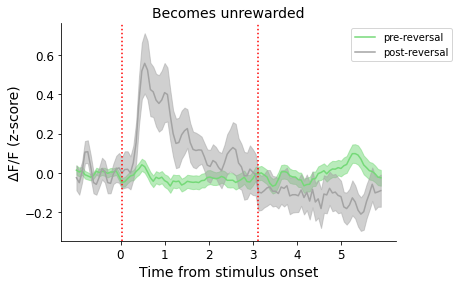

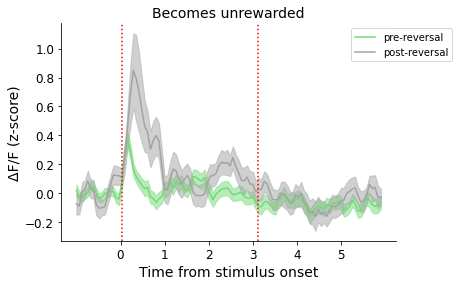

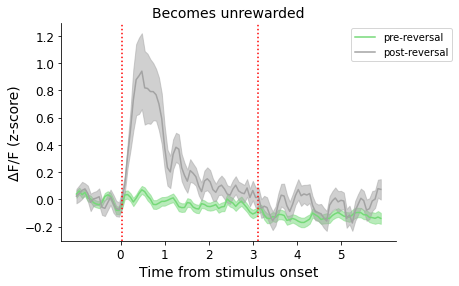

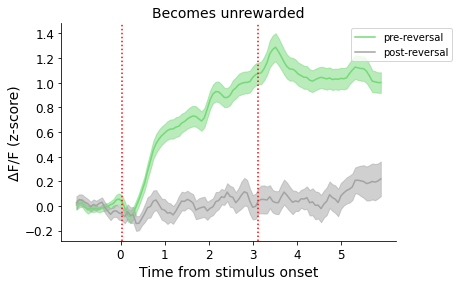

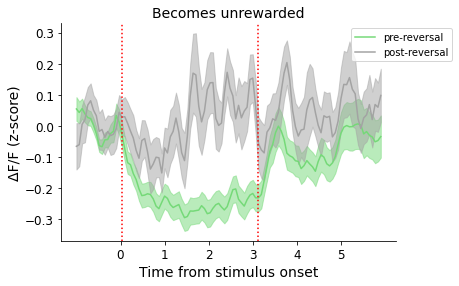

In [89]:
for i in range(np.sum(OA27_needs.pv_becomes_unrewarded.lt(0.05).values)):
    
    plt.figure()
    
    y_est = trace_list[1][5][OA27_needs.pv_becomes_unrewarded.lt(0.05).values, :][i, :].T
    plt.plot(np.arange(108), y_est, color=cas.lookups.color_dict['plus'], label='pre-reversal');
    sem = trace_list[1][3][OA27_needs.pv_becomes_unrewarded.lt(0.05).values, :][i, :].T
    plt.fill_between(np.arange(108), y_est-sem, y_est+sem, alpha=0.5, color=cas.lookups.color_dict['plus'])
    
    y_est = trace_list[1][6][OA27_needs.pv_becomes_unrewarded.lt(0.05).values, :][i, :].T
    plt.plot(np.arange(108), y_est, color=cas.lookups.color_dict['gray'], label='post-reversal');
    sem = trace_list[1][4][OA27_needs.pv_becomes_unrewarded.lt(0.05).values, :][i, :].T
    plt.fill_between(np.arange(108), y_est-sem, y_est+sem, alpha=0.5, color=cas.lookups.color_dict['gray'])
    
    sns.despine()
    plt.xticks(np.arange(15.5, 108, 15.5), labels=np.arange(0, 6, 1), size=12)
    plt.yticks(size=12)
    plt.xlabel('Time from stimulus onset', size=14)
    plt.ylabel('\u0394F/F (z-score)', size=14)
    plt.axvline(16, linestyle=':', color='red')
    plt.axvline(16*4, linestyle=':', color='red')
    plt.legend(loc=2, bbox_to_anchor=(0.85, 1))
    
    plt.title('Becomes unrewarded', size =14)
    plt.savefig(f'/twophoton_analysis/Data/analysis/Group-attractive/OA27_RMM_cells/example{i}_sig_rmm_becomes_unrewarded.pdf',
                bbox_inches='tight')


D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


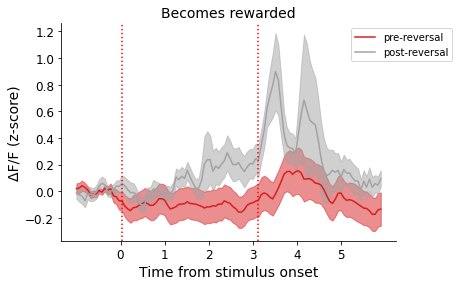

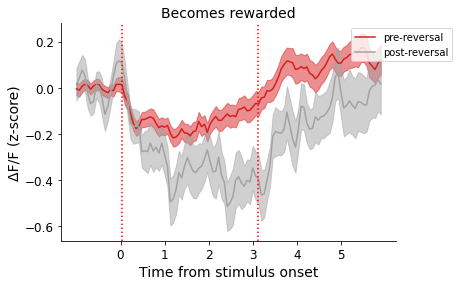

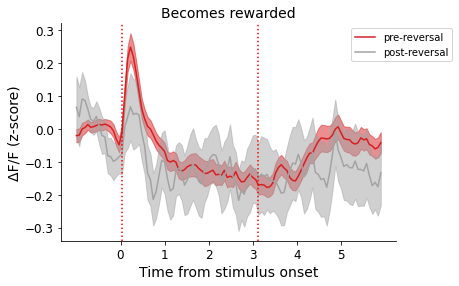

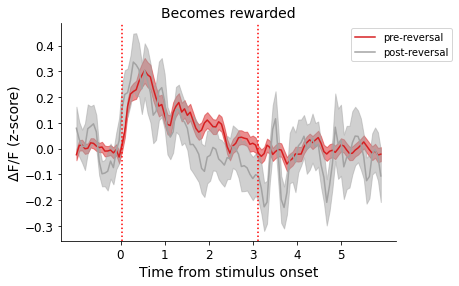

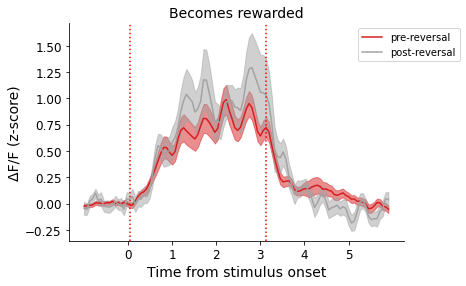

...

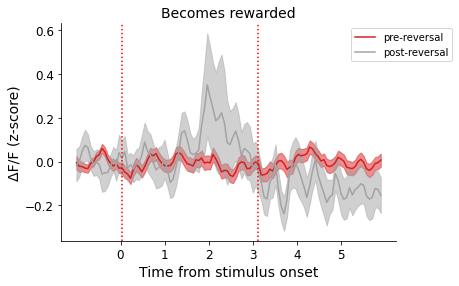

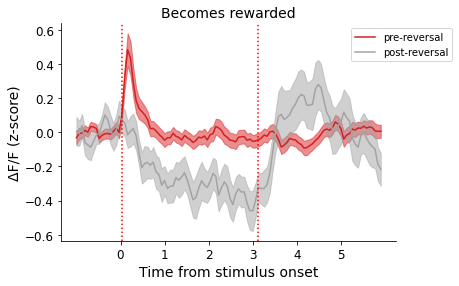

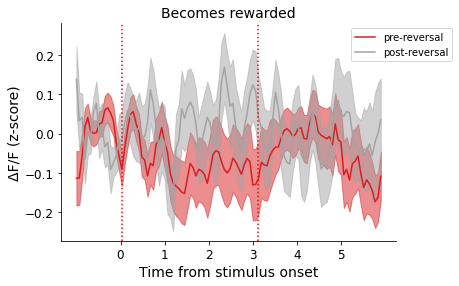

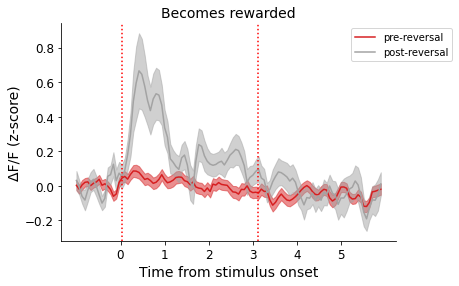

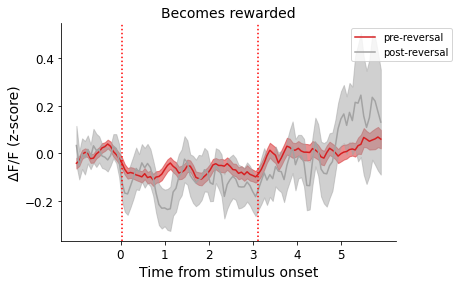

In [90]:
for i in range(np.sum(OA27_needs.pv_becomes_rewarded.lt(0.05).values)):
    
    plt.figure()
    
    y_est = trace_list[0][5][OA27_needs.pv_becomes_rewarded.lt(0.05).values, :][i, :].T
    plt.plot(np.arange(108), y_est, color=cas.lookups.color_dict['minus'], label='pre-reversal');
    sem = trace_list[0][3][OA27_needs.pv_becomes_rewarded.lt(0.05).values, :][i, :].T
    plt.fill_between(np.arange(108), y_est-sem, y_est+sem, alpha=0.5, color=cas.lookups.color_dict['minus'])
    
    y_est = trace_list[0][6][OA27_needs.pv_becomes_rewarded.lt(0.05).values, :][i, :].T
    plt.plot(np.arange(108), y_est, color=cas.lookups.color_dict['gray'], label='post-reversal');
    sem = trace_list[0][4][OA27_needs.pv_becomes_rewarded.lt(0.05).values, :][i, :].T
    plt.fill_between(np.arange(108), y_est-sem, y_est+sem, alpha=0.5, color=cas.lookups.color_dict['gray'])
    
    sns.despine()
    plt.xticks(np.arange(15.5, 108, 15.5), labels=np.arange(0, 6, 1), size=12)
    plt.yticks(size=12)
    plt.xlabel('Time from stimulus onset', size=14)
    plt.ylabel('\u0394F/F (z-score)', size=14)
    plt.axvline(16, linestyle=':', color='red')
    plt.axvline(16*4, linestyle=':', color='red')
    plt.legend(loc=2, bbox_to_anchor=(0.85, 1))
    
    plt.title('Becomes rewarded', size =14)
    plt.savefig(f'/twophoton_analysis/Data/analysis/Group-attractive/OA27_RMM_cells/example{i}_sig_rmm_becomes_rewarded.pdf',
                bbox_inches='tight')
    


D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


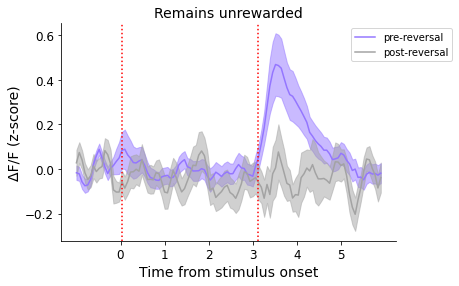

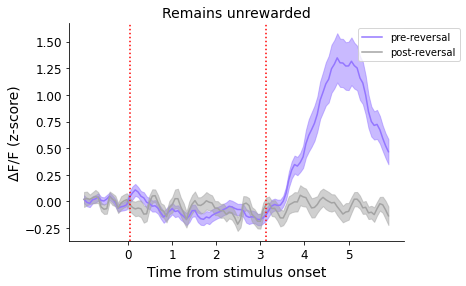

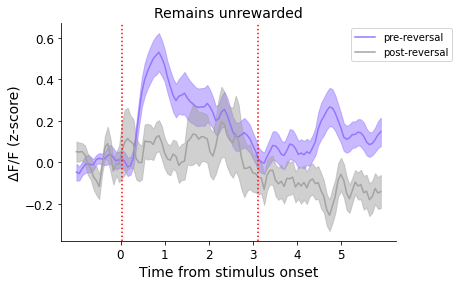

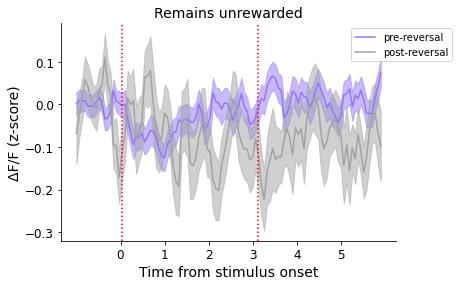

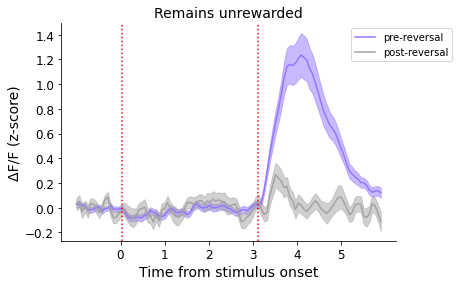

...

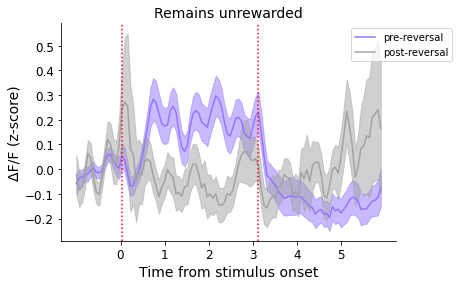

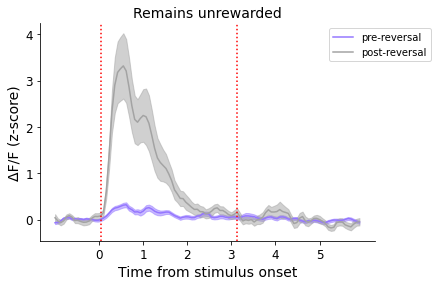

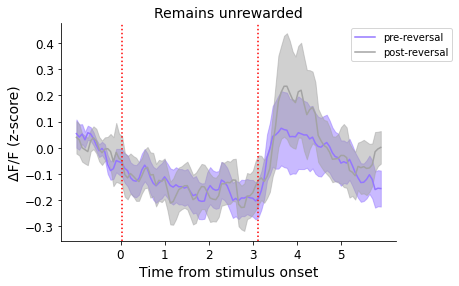

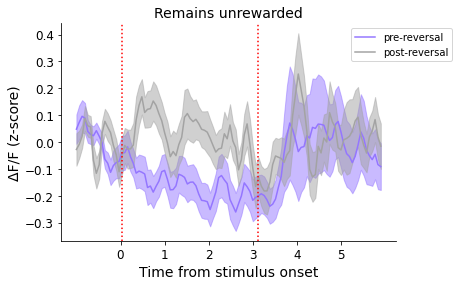

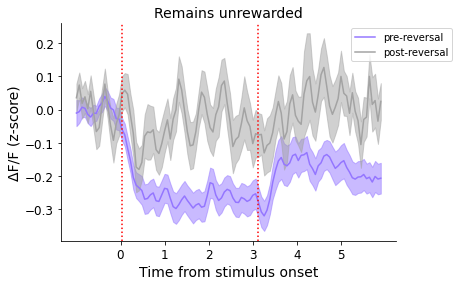

In [107]:
for i in range(np.sum(OA27_needs.pv_remains_unrewarded.lt(0.05).values)):
    
    plt.figure()
    
    y_est = trace_list[2][5][OA27_needs.pv_remains_unrewarded.lt(0.05).values, :][i, :].T
    plt.plot(np.arange(108), y_est, color=cas.lookups.color_dict['neutral3'], label='pre-reversal');
    sem = trace_list[2][3][OA27_needs.pv_remains_unrewarded.lt(0.05).values, :][i, :].T
    plt.fill_between(np.arange(108), y_est-sem, y_est+sem, alpha=0.5, color=cas.lookups.color_dict['neutral3'])
    
    y_est = trace_list[2][6][OA27_needs.pv_remains_unrewarded.lt(0.05).values, :][i, :].T
    plt.plot(np.arange(108), y_est, color=cas.lookups.color_dict['gray'], label='post-reversal');
    sem = trace_list[2][4][OA27_needs.pv_remains_unrewarded.lt(0.05).values, :][i, :].T
    plt.fill_between(np.arange(108), y_est-sem, y_est+sem, alpha=0.5, color=cas.lookups.color_dict['gray'])
    
    sns.despine()
    plt.xticks(np.arange(15.5, 108, 15.5), labels=np.arange(0, 6, 1), size=12)
    plt.yticks(size=12)
    plt.xlabel('Time from stimulus onset', size=14)
    plt.ylabel('\u0394F/F (z-score)', size=14)
    plt.axvline(16, linestyle=':', color='red')
    plt.axvline(16*4, linestyle=':', color='red')
    plt.legend(loc=2, bbox_to_anchor=(0.85, 1))
    
    plt.title('Remains unrewarded', size =14)
    plt.savefig(f'/twophoton_analysis/Data/analysis/Group-attractive/OA27_RMM_cells/example{i}_sig_rmm_remains_unrewarded.pdf',
                bbox_inches='tight')


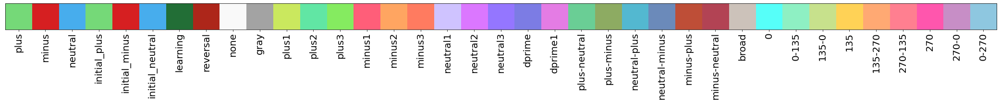

In [106]:
sns.palplot(cas.lookups.color_dict.values())
plt.xticks(np.arange(len(cas.lookups.color_dict.values())), labels=cas.lookups.color_dict.keys(), rotation=90, size=20);

# NOT significant RMM

In [ ]:
for i in range(np.sum(OA27_needs.pv_becomes_unrewarded.gt(0.05).values)):
    
    plt.figure()
    
    y_est = trace_list[1][5][OA27_needs.pv_becomes_unrewarded.gt(0.05).values, :][i, :].T
    plt.plot(np.arange(108), y_est, color=cas.lookups.color_dict['plus'], label='pre-reversal');
    sem = trace_list[1][3][OA27_needs.pv_becomes_unrewarded.gt(0.05).values, :][i, :].T
    plt.fill_between(np.arange(108), y_est-sem, y_est+sem, alpha=0.5, color=cas.lookups.color_dict['plus'])
    
    y_est = trace_list[1][6][OA27_needs.pv_becomes_unrewarded.gt(0.05).values, :][i, :].T
    plt.plot(np.arange(108), y_est, color=cas.lookups.color_dict['gray'], label='post-reversal');
    sem = trace_list[1][4][OA27_needs.pv_becomes_unrewarded.gt(0.05).values, :][i, :].T
    plt.fill_between(np.arange(108), y_est-sem, y_est+sem, alpha=0.5, color=cas.lookups.color_dict['gray'])
    
    sns.despine()
    plt.xticks(np.arange(15.5, 108, 15.5), labels=np.arange(0, 6, 1), size=12)
    plt.yticks(size=12)
    plt.xlabel('Time from stimulus onset', size=14)
    plt.ylabel('\u0394F/F (z-score)', size=14)
    plt.axvline(16, linestyle=':', color='red')
    plt.axvline(16*4, linestyle=':', color='red')
    plt.legend(loc=2, bbox_to_anchor=(0.85, 1))
    
    plt.title('Becomes unrewarded', size =14)
    plt.savefig(f'/twophoton_analysis/Data/analysis/Group-attractive/OA27_RMM_cells/example{i}_NOsig_rmm_becomes_unrewarded.pdf',
                bbox_inches='tight')


In [ ]:
for i in range(np.sum(OA27_needs.pv_becomes_rewarded.gt(0.05).values)):
    
    plt.figure()
    
    y_est = trace_list[0][5][OA27_needs.pv_becomes_rewarded.gt(0.05).values, :][i, :].T
    plt.plot(np.arange(108), y_est, color=cas.lookups.color_dict['minus'], label='pre-reversal');
    sem = trace_list[0][3][OA27_needs.pv_becomes_rewarded.gt(0.05).values, :][i, :].T
    plt.fill_between(np.arange(108), y_est-sem, y_est+sem, alpha=0.5, color=cas.lookups.color_dict['minus'])
    
    y_est = trace_list[0][6][OA27_needs.pv_becomes_rewarded.gt(0.05).values, :][i, :].T
    plt.plot(np.arange(108), y_est, color=cas.lookups.color_dict['gray'], label='post-reversal');
    sem = trace_list[0][4][OA27_needs.pv_becomes_rewarded.gt(0.05).values, :][i, :].T
    plt.fill_between(np.arange(108), y_est-sem, y_est+sem, alpha=0.5, color=cas.lookups.color_dict['gray'])
    
    sns.despine()
    plt.xticks(np.arange(15.5, 108, 15.5), labels=np.arange(0, 6, 1), size=12)
    plt.yticks(size=12)
    plt.xlabel('Time from stimulus onset', size=14)
    plt.ylabel('\u0394F/F (z-score)', size=14)
    plt.axvline(16, linestyle=':', color='red')
    plt.axvline(16*4, linestyle=':', color='red')
    plt.legend(loc=2, bbox_to_anchor=(0.85, 1))
    
    plt.title('Becomes rewarded', size =14)
    plt.savefig(f'/twophoton_analysis/Data/analysis/Group-attractive/OA27_RMM_cells/example{i}_NOsig_rmm_becomes_rewarded.pdf',
                bbox_inches='tight')
    


In [ ]:
for i in range(np.sum(OA27_needs.pv_remains_unrewarded.gt(0.05).values)):
    
    plt.figure()
    
    y_est = trace_list[2][5][OA27_needs.pv_remains_unrewarded.gt(0.05).values, :][i, :].T
    plt.plot(np.arange(108), y_est, color=cas.lookups.color_dict['neutral3'], label='pre-reversal');
    sem = trace_list[2][3][OA27_needs.pv_remains_unrewarded.gt(0.05).values, :][i, :].T
    plt.fill_between(np.arange(108), y_est-sem, y_est+sem, alpha=0.5, color=cas.lookups.color_dict['neutral3'])
    
    y_est = trace_list[2][6][OA27_needs.pv_remains_unrewarded.gt(0.05).values, :][i, :].T
    plt.plot(np.arange(108), y_est, color=cas.lookups.color_dict['gray'], label='post-reversal');
    sem = trace_list[2][4][OA27_needs.pv_remains_unrewarded.gt(0.05).values, :][i, :].T
    plt.fill_between(np.arange(108), y_est-sem, y_est+sem, alpha=0.5, color=cas.lookups.color_dict['gray'])
    
    sns.despine()
    plt.xticks(np.arange(15.5, 108, 15.5), labels=np.arange(0, 6, 1), size=12)
    plt.yticks(size=12)
    plt.xlabel('Time from stimulus onset', size=14)
    plt.ylabel('\u0394F/F (z-score)', size=14)
    plt.axvline(16, linestyle=':', color='red')
    plt.axvline(16*4, linestyle=':', color='red')
    plt.legend(loc=2, bbox_to_anchor=(0.85, 1))
    
    plt.title('Remains unrewarded', size =14)
    plt.savefig(f'/twophoton_analysis/Data/analysis/Group-attractive/OA27_RMM_cells/example{i}_NOsig_rmm_remains_unrewarded.pdf',
                bbox_inches='tight')


In [ ]:
plt.close('all')


## Testing loading data with pavlovians

In [114]:
out = cas.load.load_all_groupday('OA27', word='belarus', with_model=False, group_by='all_inc', nan_thresh=0.75)
#     sorted_model, sort_order = utils.sortfactors(out[0])
#     model_list.append(sorted_model)
#     tensor_list.append(out[2][sort_order[rank_level_sort - 1], :, :])
#     id_list.append(out[1][sort_order[rank_level_sort - 1]])
#     bhv_list.append(out[4])
#     meta_list.append(utils.add_stages_to_meta(out[3], 'parsed_11stage'))

Updated naive cs-ori pairings to match learning.
     270 plus
     135 minus
     0 neutral
Updated naive trialerror to match learning.


In [126]:
meta_test = out[3]
meta_test = utils.add_stages_to_meta(meta_test, 'parsed_11stage')
meta_test.head()

Recalcing pool.calc.performance.dprime_run: OA27 170125 3


orientation condition initial_condition  \
mouse date     run trial_idx                                            
OA27  170116.0 3   0                    0   neutral           neutral   
                   1                  135     minus             minus   
                   2                  270      plus              plus   
                   3                    0   neutral           neutral   
                   4                  135     minus             minus   

                              trialerror  prev_reward  prev_punish  \
mouse date     run trial_idx                                         
OA27  170116.0 3   0                 3.0        False        False   
                   1                 4.0        False        False   
                   2                 0.0        False        False   
                   3                 3.0        False        False   
                   4                 4.0        False        False   

                              prev_same_plus  prev_same_neutral  \
mouse date     run trial_idx                                      
OA27  170116.0 3   0                   False              False   
                   1                   False              False   
                   2                   False              False   
                   3                   False              False   
                   4                   False              False   

                              prev_same_minus  prev_blank  ... pre_licks  \
mouse date     run trial_idx                               ...             
OA27  170116.0 3   0                    False       False  ...       NaN   
                   1                    False       False  ...       NaN   
                   2                    False       False  ...       NaN   
                   3                    False       False  ...       NaN   
                   4                    False       False  ...       NaN   

                             post_licks pupil  pre_pupil  neuropil  \
mouse date     run trial_idx                                         
OA27  170116.0 3   0                NaN   NaN        NaN  0.037556   
                   1                NaN   NaN        NaN  0.033755   
                   2                NaN   NaN        NaN  0.028603   
                   3                NaN   NaN        NaN  0.024557   
                   4                NaN   NaN        NaN  0.033233   

                              pre_neuropil  brainmotion  dprime  dprime_run  \
mouse date     run trial_idx                                                  
OA27  170116.0 3   0              0.019214          NaN     0.0         0.0   
                   1              0.019138          NaN     0.0         0.0   
                   2              0.020908          NaN     0.0         0.0   
                   3              0.023407          NaN     0.0         0.0   
                   4              0.021669          NaN     0.0         0.0   

                              parsed_11stage  
mouse date     run trial_idx                  
OA27  170116.0 3   0                L0 naive  
                   1                L0 naive  
                   2                L0 naive  
                   3                L0 naive  
                   4                L0 naive  

[5 rows x 32 columns]

In [136]:
out[2].shape

(253, 108, 12111)

In [132]:
off27 = utils.get_offset_cells(meta_test, out[2])

In [207]:
l5_hit_ten = out[2][:,:, meta_test.parsed_11stage.isin(['L5 learning']) & meta_test.trialerror.isin([0])]
pre_rev_l1 = out[2][:,:, meta_test.parsed_11stage.isin(['L1 learning']) & meta_test.trialerror.isin([0])]
pre_rev_l1_pav = out[2][:,:, meta_test.parsed_11stage.isin(['L1 learning']) & meta_test.trialerror.isin([9])]

In [208]:
post_rev_tensor = out[2][:,:, meta_test.parsed_11stage.isin(['L1 reversal1']).values & meta_test.trialerror.isin([0])]
post_rev_pav = out[2][:,:, meta_test.parsed_11stage.isin(['L1 reversal1']).values & meta_test.trialerror.isin([9])]
post_rev_l5 = out[2][:,:, meta_test.parsed_11stage.isin(['L5 reversal1']).values & meta_test.trialerror.isin([0])]

r1_neut = out[2][:,:, meta_test.parsed_11stage.isin(['L1 reversal1']).values & meta_test.condition.isin(['neutral'])]

In [196]:
l1_miss_t = out[2][:,:, meta_test.parsed_11stage.isin(['L1 learning']).values & meta_test.trialerror.isin([1])]
l5_miss_t = out[2][:,:, meta_test.parsed_11stage.isin(['L5 learning', 'L4 learning']).values & meta_test.trialerror.isin([1])]

In [209]:
l5_hit = np.nanmean(l5_hit_ten, axis=2)[off27, :]

post_mean = np.nanmean(post_rev_tensor[:, :, :100], axis=2)[off27, :]
post_pav_mean = np.nanmean(post_rev_pav[:, :, :100], axis=2)[off27, :]
r1_old = np.nanmean(r1_neut[:, :, :100], axis=2)[off27, :]

pre_l1_pav = np.nanmean(pre_rev_l1_pav, axis=2)[off27, :]
pre_l1 = np.nanmean(pre_rev_l1, axis=2)[off27, :]
post_l5 = np.nanmean(post_rev_l5, axis=2)[off27, :]

l1_miss = np.nanmean(l1_miss_t, axis=2)[off27, :]
l5_miss = np.nanmean(l5_miss_t, axis=2)[off27, :]

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: Mean of empty slice
  """Entry point for launching an IPython kernel.
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: Mean of empty slice
  This is separate from the ipykernel package so we can avoid doing imports until
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: Mean of empty slice
  after removing the cwd from sys.path.
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: Mean of empty slice
  """
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: Mean of empty slice
  
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: Mean of empty slice
  if __name__ == '__main__':
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning: Mean of empty slice
  # This is added back by InteractiveShe

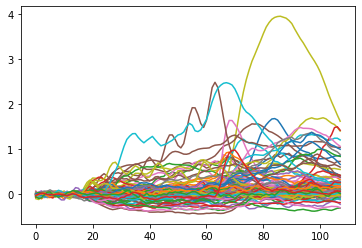

In [159]:
plt.plot(pre_mean.T);

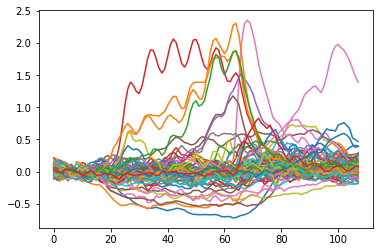

In [160]:
plt.plot(post_mean.T);

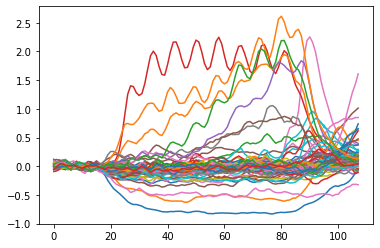

In [161]:
plt.plot(post_pav_mean.T);

<AxesSubplot:>

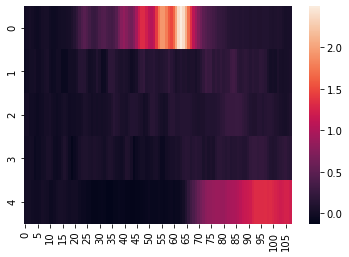

In [205]:
sns.heatmap(pre_mean[55:60, :])

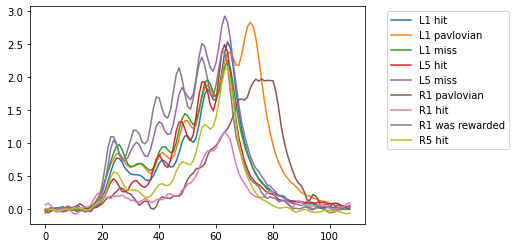

In [213]:
cell_ii = 55  # 8, 20, 59
plt.plot(pre_l1[cell_ii, :], label='L1 hit');
plt.plot(pre_l1_pav[cell_ii, :], label='L1 pavlovian');
plt.plot(l1_miss[cell_ii, :], label='L1 miss');
plt.plot(l5_hit[cell_ii, :], label='L5 hit');
plt.plot(l5_miss[cell_ii, :], label='L5 miss');
plt.plot(post_pav_mean[cell_ii, :], label='R1 pavlovian');
plt.plot(post_mean[cell_ii, :], label='R1 hit');
plt.plot(r1_old[cell_ii, :], label='R1 was rewarded');
plt.plot(post_l5[cell_ii, :], label='R5 hit');
plt.legend(loc=2, bbox_to_anchor=(1.05, 1.0))

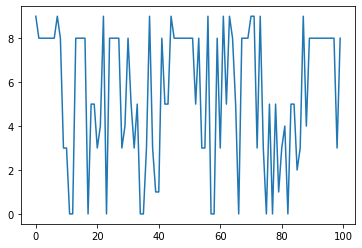

In [118]:
meta_test = out[3]
meta_rev = meta_test.loc[meta_test.learning_state.isin(['reversal1'])]
plt.plot(meta_rev.trialerror.iloc[:100].values)

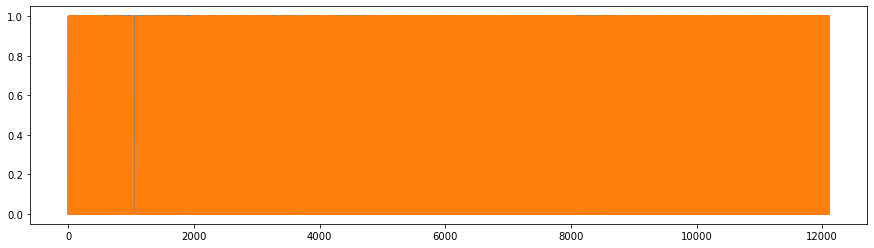

In [38]:
plt.figure(figsize=(15,4))
plt.plot(out[3].trialerror.isin([8, 9]).values)
plt.plot(out[3].trialerror.isin([0, 1]).values)

# TODO
- Add in trace calculation/comparizon at reversal; goal is to find example
positive and negative mismatch cells (keep track of cue/mismatch type)